From https://github.com/krrish94/nerf-pytorch

## Tiny NeRF (A PyTorch implementation)

So, this weekend, I was catching up on this _cool paper_ titled [*NeRF: Representing scenes as neural radiance fields for view synthesis*](https://arxiv.org/abs/2003.08934)!

The authors released a TensorFlow implementation [here](https://github.com/bmild/nerf). Deciding to delve deeper, I ported their code to PyTorch, cause why not!

> *DISCLAIMER*: This notebook (and repository) is work-in-progress. Although I have rigorously tested most modules in here (to faithfully replicate the original implementation), my implementation at places deviates from the authors'. Comments/criticism welcome!

> All functions that have a `#TESTED` under the docstring imply that they have been tested against their corresponding tensorflow impls.

In [ ]:
# Import all the good stuff
from typing import Optional

import numpy as np
import torch
import matplotlib.pyplot as plt

## A few utility functions

#### Bridging PyTorch and TensorFlow functionality

There's plenty of differences in function signatures (and in functionality) b/w PyTorch and TensorFlow. Here's a few modules that help bridge the gap (for this particular impl).

In [ ]:
def meshgrid_xy(tensor1: torch.Tensor, tensor2: torch.Tensor) -> (torch.Tensor, torch.Tensor):
    """Mimick np.meshgrid(..., indexing="xy") in pytorch. torch.meshgrid only allows "ij" indexing.
    (If you're unsure what this means, safely skip trying to understand this, and run a tiny example!)

    Args:
      tensor1 (torch.Tensor): Tensor whose elements define the first dimension of the returned meshgrid.
      tensor2 (torch.Tensor): Tensor whose elements define the second dimension of the returned meshgrid.
    """
    # TESTED
    ii, jj = torch.meshgrid(tensor1, tensor2)
    return ii.transpose(-1, -2), jj.transpose(-1, -2)


def cumprod_exclusive(tensor: torch.Tensor) -> torch.Tensor:
  r"""Mimick functionality of tf.math.cumprod(..., exclusive=True), as it isn't available in PyTorch.

  Args:
    tensor (torch.Tensor): Tensor whose cumprod (cumulative product, see `torch.cumprod`) along dim=-1
      is to be computed.
  
  Returns:
    cumprod (torch.Tensor): cumprod of Tensor along dim=-1, mimiciking the functionality of
      tf.math.cumprod(..., exclusive=True) (see `tf.math.cumprod` for details).
  """
  # TESTED
  # Only works for the last dimension (dim=-1)
  dim = -1
  # Compute regular cumprod first (this is equivalent to `tf.math.cumprod(..., exclusive=False)`).
  cumprod = torch.cumprod(tensor, dim)
  # "Roll" the elements along dimension 'dim' by 1 element.
  cumprod = torch.roll(cumprod, 1, dim)
  # Replace the first element by "1" as this is what tf.cumprod(..., exclusive=True) does.
  cumprod[..., 0] = 1.
  
  return cumprod

#### Compute the "bundle" of rays through all pixels of an image.

In [ ]:
def get_ray_bundle(height: int, width: int, focal_length: float, tform_cam2world: torch.Tensor):
  r"""Compute the bundle of rays passing through all pixels of an image (one ray per pixel).

  Args:
    height (int): Height of an image (number of pixels).
    width (int): Width of an image (number of pixels).
    focal_length (float or torch.Tensor): Focal length (number of pixels, i.e., calibrated intrinsics).
    tform_cam2world (torch.Tensor): A 6-DoF rigid-body transform (shape: :math:`(4, 4)`) that
      transforms a 3D point from the camera frame to the "world" frame for the current example.
  
  Returns:
    ray_origins (torch.Tensor): A tensor of shape :math:`(width, height, 3)` denoting the centers of
      each ray. `ray_origins[i][j]` denotes the origin of the ray passing through pixel at
      row index `j` and column index `i`.
      (TODO: double check if explanation of row and col indices convention is right).
    ray_directions (torch.Tensor): A tensor of shape :math:`(width, height, 3)` denoting the
      direction of each ray (a unit vector). `ray_directions[i][j]` denotes the direction of the ray
      passing through the pixel at row index `j` and column index `i`.
      (TODO: double check if explanation of row and col indices convention is right).
  """
  # TESTED
  ii, jj = meshgrid_xy(
      torch.arange(width).to(tform_cam2world),
      torch.arange(height).to(tform_cam2world)
  )
  directions = torch.stack([(ii - width * .5) / focal_length,
                            -(jj - height * .5) / focal_length,
                            -torch.ones_like(ii)
                           ], dim=-1)
  ray_directions = torch.sum(directions[..., None, :] * tform_cam2world[:3, :3], dim=-1)
  ray_origins = tform_cam2world[:3, -1].expand(ray_directions.shape)
  return ray_origins, ray_directions

#### Compute "query" 3D points given the "bundle" of rays.

We assume that a _near_ and a _far_ clipping distance are provided that delineate the volume of interest. Each ray is evaluated only within these bounds. We randomly sample points along each ray, while trying to ensure most parts of the ray's trajectory are spanned.

In [ ]:
def compute_query_points_from_rays(
    ray_origins: torch.Tensor,
    ray_directions: torch.Tensor,
    near_thresh: float,
    far_thresh: float,
    num_samples: int,
    randomize: Optional[bool] = True
) -> (torch.Tensor, torch.Tensor):
  r"""Compute query 3D points given the "bundle" of rays. The near_thresh and far_thresh
  variables indicate the bounds within which 3D points are to be sampled.

  Args:
    ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
      `get_ray_bundle()` method (shape: :math:`(width, height, 3)`).
    ray_directions (torch.Tensor): Direction of each ray in the "bundle" as returned by the
      `get_ray_bundle()` method (shape: :math:`(width, height, 3)`).
    near_thresh (float): The 'near' extent of the bounding volume (i.e., the nearest depth
      coordinate that is of interest/relevance).
    far_thresh (float): The 'far' extent of the bounding volume (i.e., the farthest depth
      coordinate that is of interest/relevance).
    num_samples (int): Number of samples to be drawn along each ray. Samples are drawn
      randomly, whilst trying to ensure "some form of" uniform spacing among them.
    randomize (optional, bool): Whether or not to randomize the sampling of query points.
      By default, this is set to `True`. If disabled (by setting to `False`), we sample
      uniformly spaced points along each ray in the "bundle".
  
  Returns:
    query_points (torch.Tensor): Query points along each ray
      (shape: :math:`(width, height, num_samples, 3)`).
    depth_values (torch.Tensor): Sampled depth values along each ray
      (shape: :math:`(num_samples)`).
  """
  # TESTED
  # shape: (num_samples)
  depth_values = torch.linspace(near_thresh, far_thresh, num_samples).to(ray_origins)
  if randomize is True:
    # ray_origins: (width, height, 3)
    # noise_shape = (width, height, num_samples)
    noise_shape = list(ray_origins.shape[:-1]) + [num_samples]
    # depth_values: (num_samples)
    depth_values = depth_values \
        + torch.rand(noise_shape).to(ray_origins) * (far_thresh
            - near_thresh) / num_samples
  # (width, height, num_samples, 3) = (width, height, 1, 3) + (width, height, 1, 3) * (num_samples, 1)
  # query_points:  (width, height, num_samples, 3)
  query_points = ray_origins[..., None, :] + ray_directions[..., None, :] * depth_values[..., :, None]
  # TODO: Double-check that `depth_values` returned is of shape `(num_samples)`.
  return query_points, depth_values

#### Volumetric rendering

> **NOTE**: This volumetric rendering module (like the authors' tiny_nerf [Colab notebook](https://colab.research.google.com/github/bmild/nerf/blob/master/tiny_nerf.ipynb) does not implement 5D input (which includes view directions, in addition to X, Y, Z coordinates). It also does not implement the hierarchical sampling procedure. For those implementations, refer to the other complete examples in the repo.

In [ ]:
def render_volume_density(
    radiance_field: torch.Tensor,
    ray_origins: torch.Tensor,
    depth_values: torch.Tensor
) -> (torch.Tensor, torch.Tensor, torch.Tensor):
  r"""Differentiably renders a radiance field, given the origin of each ray in the
  "bundle", and the sampled depth values along them.

  Args:
    radiance_field (torch.Tensor): A "field" where, at each query location (X, Y, Z),
      we have an emitted (RGB) color and a volume density (denoted :math:`\sigma` in
      the paper) (shape: :math:`(width, height, num_samples, 4)`).
    ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
      `get_ray_bundle()` method (shape: :math:`(width, height, 3)`).
    depth_values (torch.Tensor): Sampled depth values along each ray
      (shape: :math:`(num_samples)`).
  
  Returns:
    rgb_map (torch.Tensor): Rendered RGB image (shape: :math:`(width, height, 3)`).
    depth_map (torch.Tensor): Rendered depth image (shape: :math:`(width, height)`).
    acc_map (torch.Tensor): # TODO: Double-check (I think this is the accumulated
      transmittance map).
  """
  # TESTED
  sigma_a = torch.nn.functional.relu(radiance_field[..., 3])
  rgb = torch.sigmoid(radiance_field[..., :3])
  one_e_10 = torch.tensor([1e10], dtype=ray_origins.dtype, device=ray_origins.device)
  dists = torch.cat((depth_values[..., 1:] - depth_values[..., :-1],
                  one_e_10.expand(depth_values[..., :1].shape)), dim=-1)
  alpha = 1. - torch.exp(-sigma_a * dists)
  weights = alpha * cumprod_exclusive(1. - alpha + 1e-10)

  rgb_map = (weights[..., None] * rgb).sum(dim=-2)
  depth_map = (weights * depth_values).sum(dim=-1)
  acc_map = weights.sum(-1)

  return rgb_map, depth_map, acc_map

#### Positional encoding

Another interesting tweak used in NeRF is "positional encoding", which postulates the use of a mapping to higher dimensional space (using a basis set of high-frequency functions). This greatly enhances the model's capability to capture high-frequency variations.

In [ ]:
def positional_encoding(
    tensor, num_encoding_functions=6, include_input=True, log_sampling=True
) -> torch.Tensor:
  r"""Apply positional encoding to the input.

  Args:
    tensor (torch.Tensor): Input tensor to be positionally encoded.
    num_encoding_functions (optional, int): Number of encoding functions used to
        compute a positional encoding (default: 6).
    include_input (optional, bool): Whether or not to include the input in the
        computed positional encoding (default: True).
    log_sampling (optional, bool): Sample logarithmically in frequency space, as
        opposed to linearly (default: True).
  
  Returns:
    (torch.Tensor): Positional encoding of the input tensor.
  """
  # TESTED
  # Trivially, the input tensor is added to the positional encoding.
  encoding = [tensor] if include_input else []
  # Now, encode the input using a set of high-frequency functions and append the
  # resulting values to the encoding.
  frequency_bands = None
  if log_sampling:
      frequency_bands = 2.0 ** torch.linspace(
            0.0,
            num_encoding_functions - 1,
            num_encoding_functions,
            dtype=tensor.dtype,
            device=tensor.device,
        )
  else:
      frequency_bands = torch.linspace(
          2.0 ** 0.0,
          2.0 ** (num_encoding_functions - 1),
          num_encoding_functions,
          dtype=tensor.dtype,
          device=tensor.device,
      )

  for freq in frequency_bands:
      for func in [torch.sin, torch.cos]:
          encoding.append(func(tensor * freq))

  # Special case, for no positional encoding
  if len(encoding) == 1:
      return encoding[0]
  else:
      return torch.cat(encoding, dim=-1)

## TinyNeRF: Network architecture

In [ ]:
import torch.nn as nn
class VeryTinyNerfModel(torch.nn.Module):
  r"""Define a "very tiny" NeRF model comprising three fully connected layers.
  """
  def __init__(self, n_layers=3, filter_size=128, num_encoding_functions=6, activation=nn.ReLU()):
    super(VeryTinyNerfModel, self).__init__()
    # Input layer (default: 39 -> 128)
    layers = [
        nn.Linear(3 + 3 * 2 * num_encoding_functions, filter_size),
        activation
    ]
    for i in range(1, n_layers - 1):
        layers.extend([nn.Linear(filter_size, filter_size), activation])
    layers.append(nn.Linear(filter_size, 4))
    self.layers = nn.Sequential(*layers)
  
  def forward(self, x):
    x = self.layers(x)
    return x

## Dataloading utils

In [ ]:
def get_minibatches(inputs: torch.Tensor, chunksize: Optional[int] = 1024 * 8):
  r"""Takes a huge tensor (ray "bundle") and splits it into a list of minibatches.
  Each element of the list (except possibly the last) has dimension `0` of length
  `chunksize`.
  """
  return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

## Get data

In [ ]:
# Download sample data used in the official tiny_nerf example
import os
if not os.path.exists('tiny_nerf_data.npz'):
    !wget https://people.eecs.berkeley.edu/~bmild/nerf/tiny_nerf_data.npz

--2021-12-03 16:23:33--  https://people.eecs.berkeley.edu/~bmild/nerf/tiny_nerf_data.npz
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2021-12-03 16:23:34 ERROR 403: Forbidden.



## Determine device to run on (GPU vs CPU)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Load up input images, poses, intrinsics, etc.

In [ ]:
# Load input images, poses, and intrinsics
data = np.load("tiny_nerf_data.npz")

# Images
images = data["images"]
# Camera extrinsics (poses)
tform_cam2world = data["poses"]
tform_cam2world = torch.from_numpy(tform_cam2world).to(device)
# Focal length (intrinsics)
focal_length = data["focal"]
focal_length = torch.from_numpy(focal_length).to(device)

# Height and width of each image
height, width = images.shape[1:3]

# Near and far clipping thresholds for depth values.
near_thresh = 2.
far_thresh = 6.

# # Hold one image out (for test).
# testimg, testpose = images[95], tform_cam2world[95]
# testimg = torch.from_numpy(testimg).to(device)

# Map images to device
images = torch.from_numpy(images[:100, ..., :3]).to(device)

#### Display the image used for testing

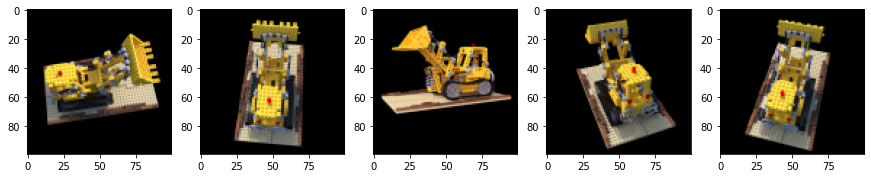

In [ ]:
idx = np.random.randint(images.size(0), size=5)
fig, axs = plt.subplots(1,5, figsize=(15,5))
for id, ax in zip(idx, axs.reshape(-1)):
    ax.imshow(images[id].detach().numpy())
plt.show()

## Training functions

In [ ]:
# One iteration of TinyNeRF (forward pass).
def run_one_iter_of_tinynerf(height, width, focal_length, tform_cam2world,
                             near_thresh, far_thresh, depth_samples_per_ray,
                             encoding_function, get_minibatches_function):
  
  # Get the "bundle" of rays through all image pixels.
  ray_origins, ray_directions = get_ray_bundle(height, width, focal_length,
                                               tform_cam2world)
  
  # Sample query points along each ray
  query_points, depth_values = compute_query_points_from_rays(
      ray_origins, ray_directions, near_thresh, far_thresh, depth_samples_per_ray
  )

  # "Flatten" the query points.
  flattened_query_points = query_points.reshape((-1, 3))

  # Encode the query points (default: positional encoding).
  encoded_points = encoding_function(flattened_query_points)

  # Split the encoded points into "chunks", run the model on all chunks, and
  # concatenate the results (to avoid out-of-memory issues).
  batches = get_minibatches_function(encoded_points, chunksize=chunksize)
  predictions = []
  for batch in batches:
    predictions.append(model(batch))
  radiance_field_flattened = torch.cat(predictions, dim=0)

  # "Unflatten" to obtain the radiance field.
  unflattened_shape = list(query_points.shape[:-1]) + [4]
  radiance_field = torch.reshape(radiance_field_flattened, unflattened_shape)

  # Perform differentiable volume rendering to re-synthesize the RGB image.
  rgb_predicted, _, _ = render_volume_density(radiance_field, ray_origins, depth_values)

  return rgb_predicted

In [ ]:
from tqdm.auto import tqdm, trange

In [ ]:
!pip install wandb
import wandb
wandb.login()

In [ ]:
def train(model, optimizer, encode, num_iter=1000, name='tiny-nerf', config=None):
    wandb.init(name=name, project='NeRF', config=config)
    psnrs = []
    iternums = []

    for i in trange(num_iters):

        # Randomly pick an image as the target.
        target_img_idx = np.random.randint(images.shape[0])
        target_img = images[target_img_idx].to(device)
        target_tform_cam2world = tform_cam2world[target_img_idx].to(device)

        # Run one iteration of TinyNeRF and get the rendered RGB image.
        rgb_predicted = run_one_iter_of_tinynerf(height, width, focal_length,
                                                target_tform_cam2world, near_thresh,
                                                far_thresh, depth_samples_per_ray,
                                                encode, get_minibatches)

        # Compute mean-squared error between the predicted and target images. Backprop!
        loss = torch.nn.functional.mse_loss(rgb_predicted, target_img)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        # Display images/plots/stats
        if i % display_every == 0:
            # Render the held-out view

            idx = np.random.randint(images.size(0),size=1)[0]
            testimg, testpose = images[idx], tform_cam2world[idx]
            rgb_predicted = run_one_iter_of_tinynerf(height, width, focal_length,
                                                    testpose, near_thresh,
                                                    far_thresh, depth_samples_per_ray,
                                                    encode, get_minibatches)
            loss = torch.nn.functional.mse_loss(rgb_predicted, target_img)
            print("Loss:", loss.item())
            psnr = -10. * torch.log10(loss)
            
            psnrs.append(psnr.item())
            iternums.append(i)

            plt.figure(figsize=(15, 4))
            plt.subplot(131)
            plt.imshow(testimg.detach().cpu().numpy())
            plt.title(f"GT: Iteration {i}")
            plt.subplot(132)
            plt.imshow(rgb_predicted.detach().cpu().numpy())
            plt.title(f"Predicted: Iteration {i}")
            plt.subplot(133)
            plt.plot(iternums, psnrs)
            plt.title("PSNR")
            plt.show()
            wandb.log({
                'loss': loss.item(),
                'psnr': psnr,
                'ground truth': wandb.Image(testimg.detach().cpu().numpy()),
                'predicted': wandb.Image(rgb_predicted.detach().cpu().numpy())
            })

    print('Done!')
    return psnrs, iternums

In [ ]:
from dataclasses import dataclass 
@dataclass
class TinyNeRFConfig:
    num_encoding_functions: int = 6
    depth_samples_per_ray: int = 32
    chunksize: int = 4096
    lr: float = 5e-3
    num_iters: int = 1000
    display_every: int = 50
    n_layers: int = 3
    filter_size: int = 128

TinyNeRFConfig()

TinyNeRFConfig(num_encoding_functions=6, depth_samples_per_ray=32, chunksize=4096, lr=0.005, num_iters=1000, display_every=50, n_layers=3, filter_size=128)

## Runs

### With PE
$L = 6$

In [ ]:
"""
Parameters for TinyNeRF training
"""
config = TinyNeRFConfig()
num_encoding_functions = 6
encode = lambda x: positional_encoding(x, num_encoding_functions=num_encoding_functions)
depth_samples_per_ray = 32
chunksize = 4096
num_iters = 1000

display_every = 50  # logging step

model = VeryTinyNerfModel(num_encoding_functions=num_encoding_functions)
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=config.lr)

loss,▁
psnr,▁
loss,0.15501
psnr,8.09627


  0%|          | 0/1000 [00:00<?, ?it/s]

Loss: 0.12768304347991943


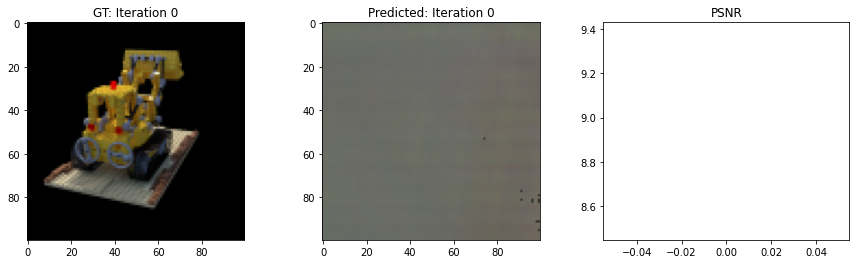

Loss: 0.04140004515647888


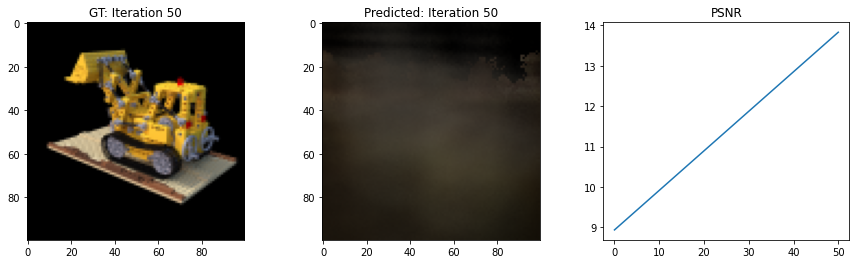

Loss: 0.024561027064919472


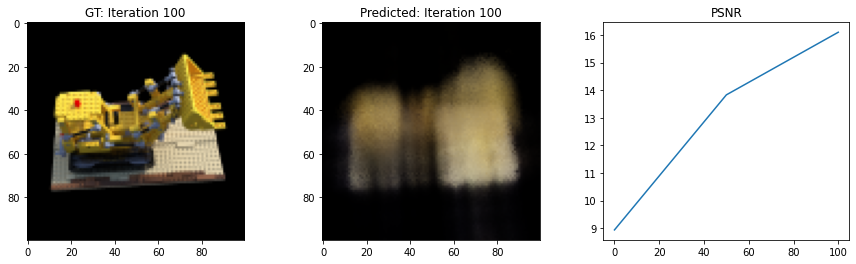

Loss: 0.05246194824576378


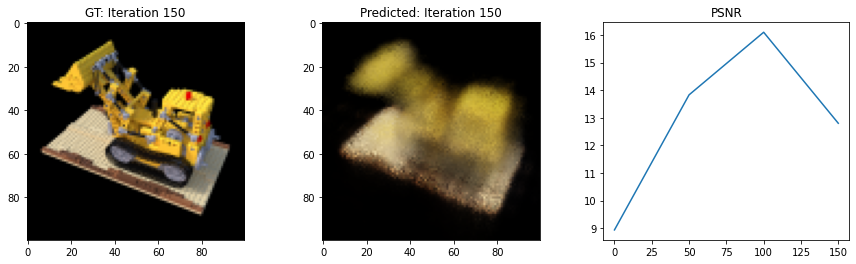

Loss: 0.06967147439718246


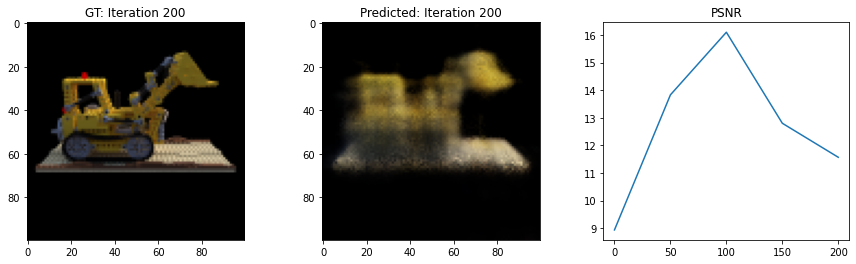

Loss: 0.007346708327531815


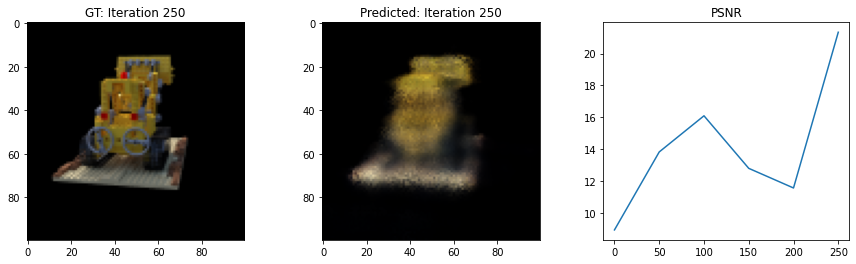

Loss: 0.04467417299747467


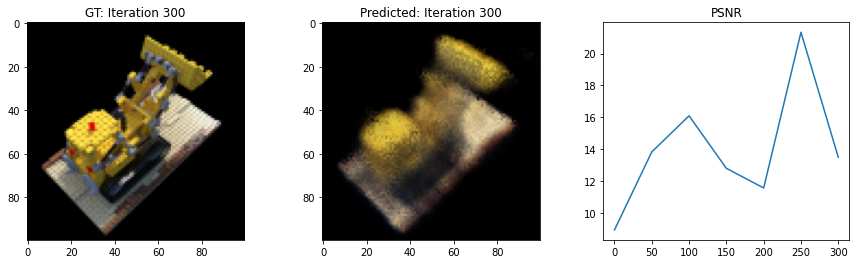

Loss: 0.08144843578338623


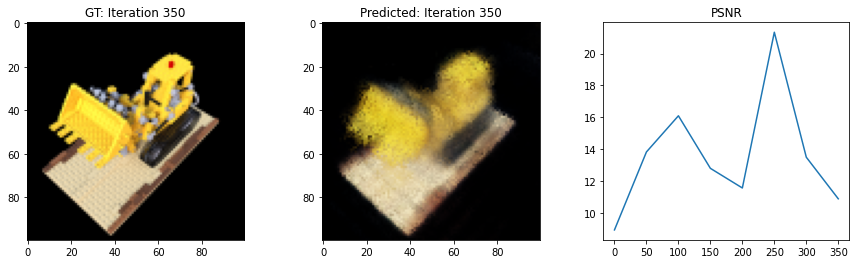

Loss: 0.0802394449710846


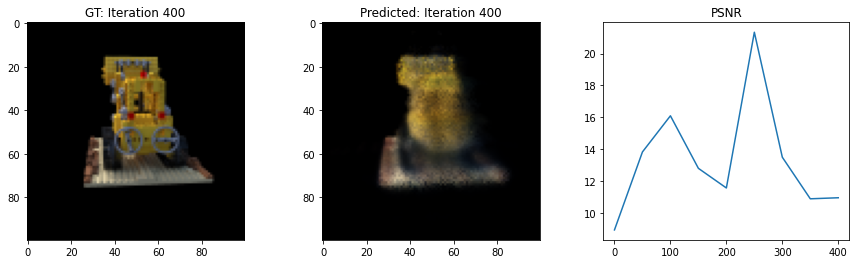

Loss: 0.053613871335983276


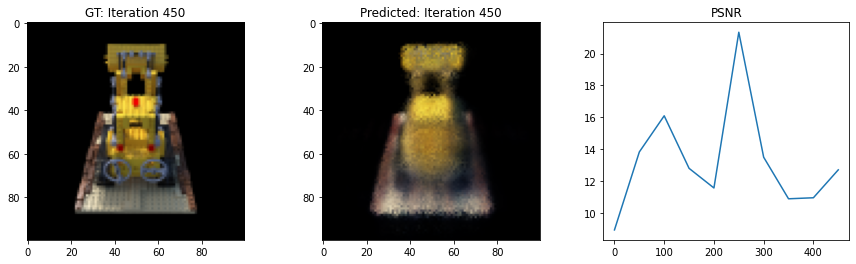

Loss: 0.06729641556739807


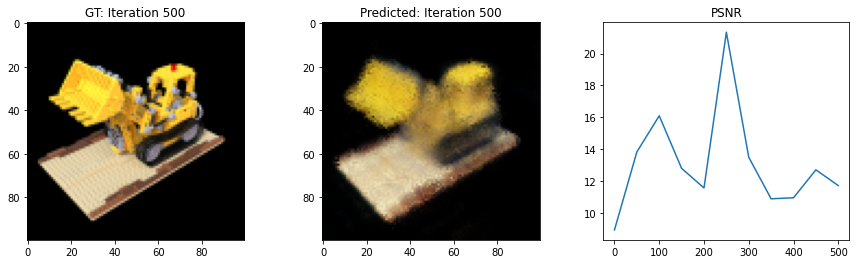

Loss: 0.09499409049749374


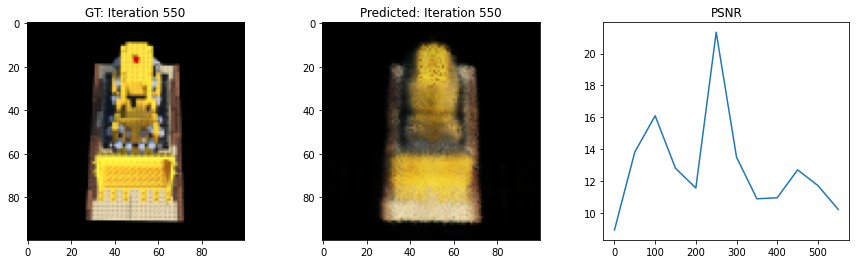

Loss: 0.06945895403623581


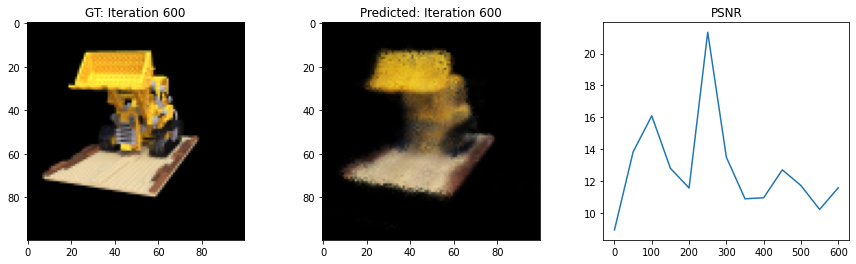

Loss: 0.01208631880581379


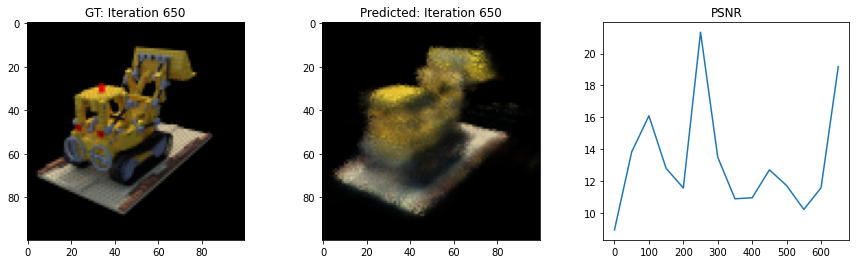

Loss: 0.08507250249385834


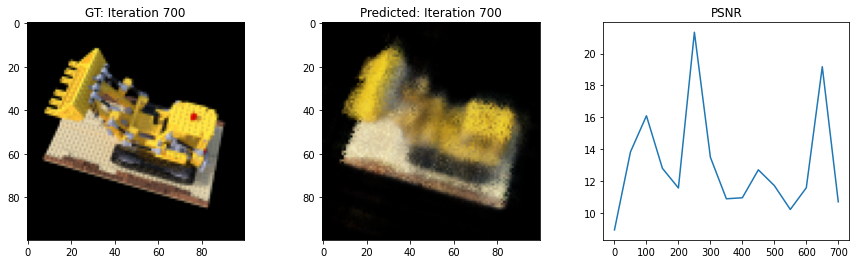

Loss: 0.08428002893924713


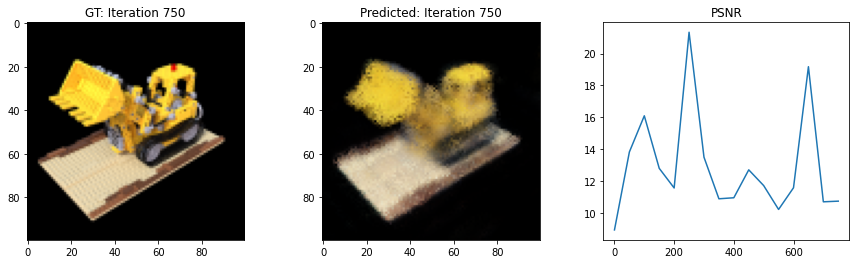

Loss: 0.07119189202785492


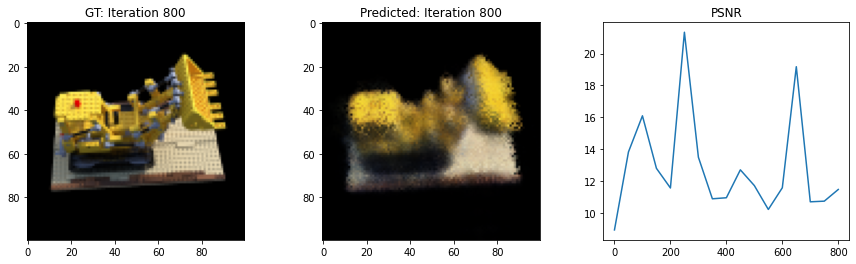

Loss: 0.03082353062927723


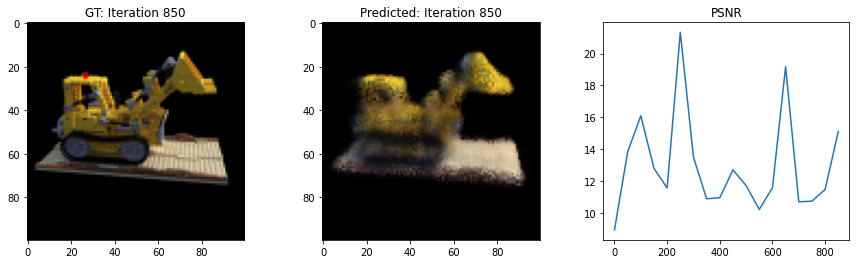

Loss: 0.050916824489831924


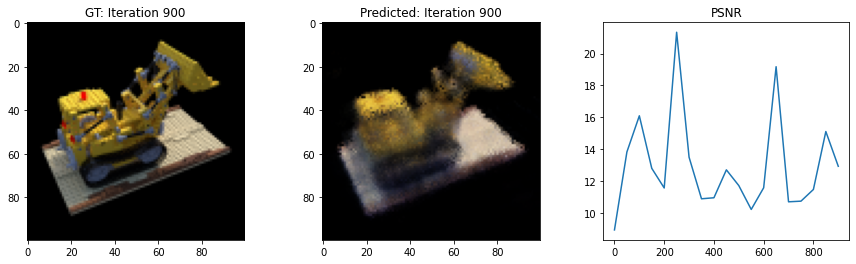

Loss: 0.04510882496833801


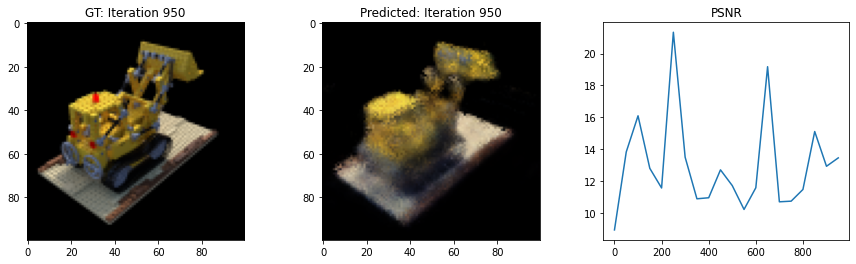

Done!


([8.938667297363281,
  13.829992294311523,
  16.0975341796875,
  12.801555633544922,
  11.569450378417969,
  21.339073181152344,
  13.499435424804688,
  10.891172409057617,
  10.956120491027832,
  12.707228660583496,
  11.720080375671387,
  10.223034858703613,
  11.582717895507812,
  19.177059173583984,
  10.702108383178711,
  10.742753982543945,
  11.47569465637207,
  15.111175537109375,
  12.931386947631836,
  13.457385063171387],
 [0,
  50,
  100,
  150,
  200,
  250,
  300,
  350,
  400,
  450,
  500,
  550,
  600,
  650,
  700,
  750,
  800,
  850,
  900,
  950])

In [ ]:
train(model, optimizer, encode, config.num_iters, name='tiny-nerf-3-layers+pe', config=config)

### No positional encoding

In [ ]:
num_encoding_functions = 0    # NO POSITIONAL ENCODING
encode = lambda x: positional_encoding(x, num_encoding_functions=num_encoding_functions)
depth_samples_per_ray = 32
chunksize = 4096

lr = 5e-3
num_iters = 2000

display_every = 50  # Number of iters after which stats are displayed
model = VeryTinyNerfModel(num_encoding_functions=num_encoding_functions)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

loss,▁
psnr,▁
loss,0.05973
psnr,12.23816


  0%|          | 0/2000 [00:00<?, ?it/s]

Loss: 0.20070965588092804


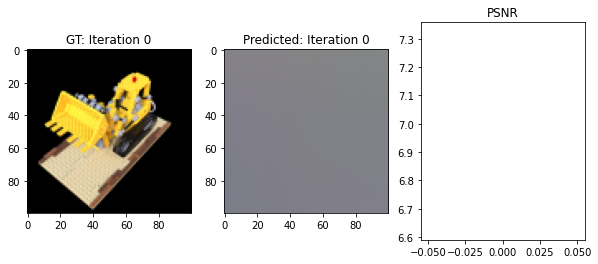

Loss: 0.07460750639438629


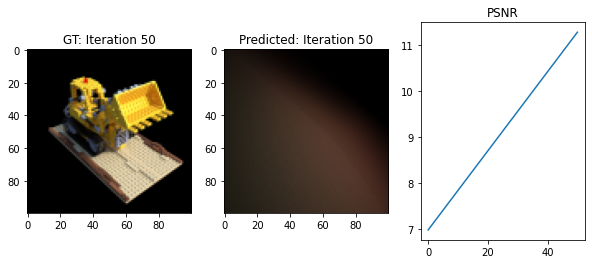

Loss: 0.03206908702850342


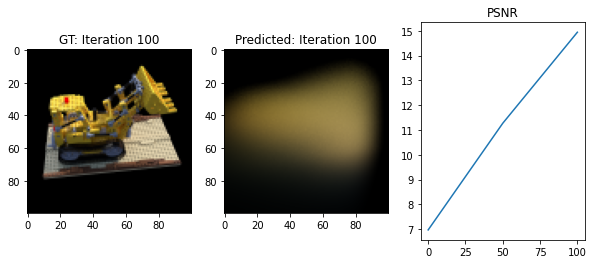

Loss: 0.02988089621067047


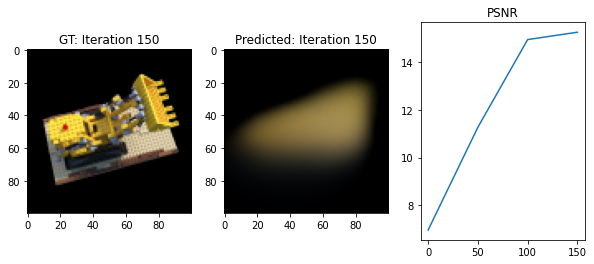

Loss: 0.052101485431194305


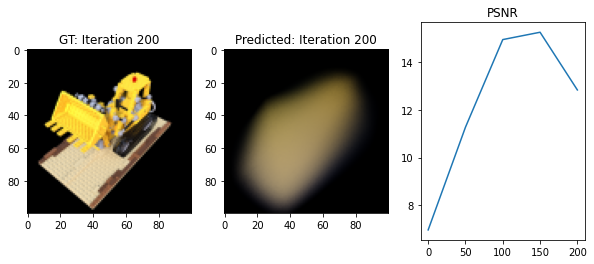

Loss: 0.08807224780321121


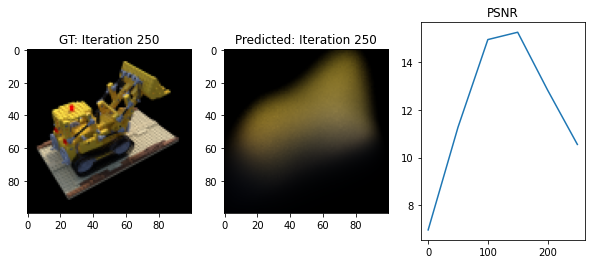

Loss: 0.043271254748106


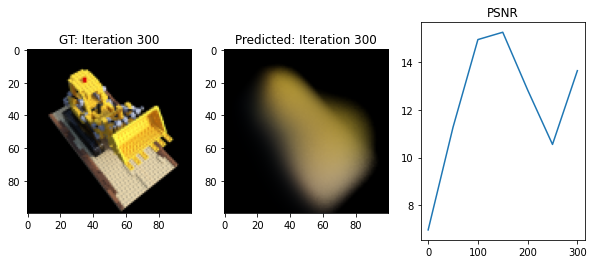

Loss: 0.04078708589076996


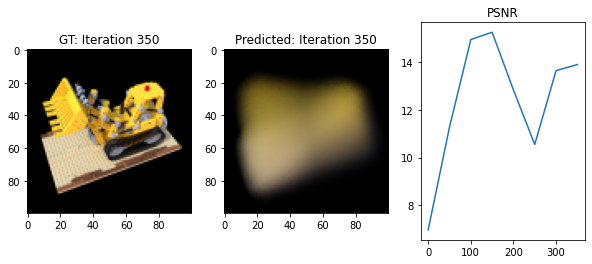

Loss: 0.027561964467167854


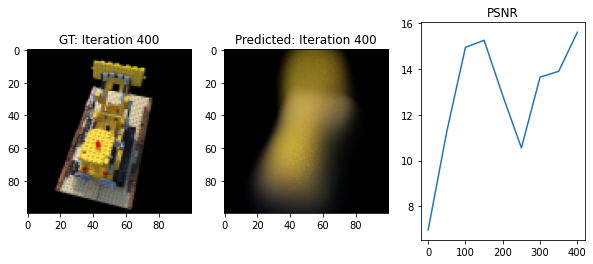

Loss: 0.044926803559064865


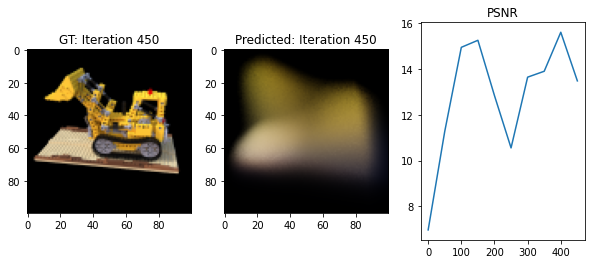

Loss: 0.09380099177360535


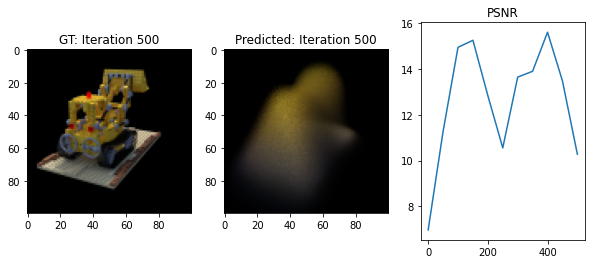

Loss: 0.07143393903970718


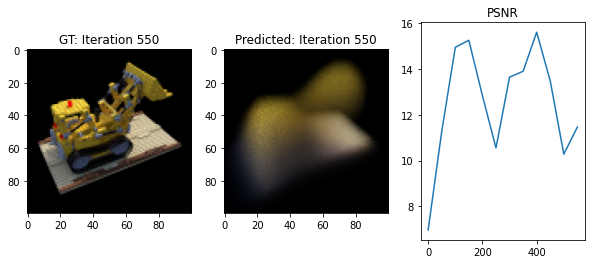

Loss: 0.023198897019028664


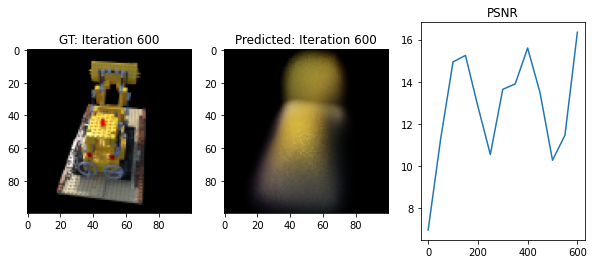

Loss: 0.09732891619205475


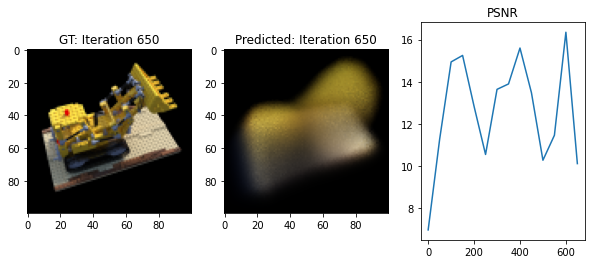

Loss: 0.04936927556991577


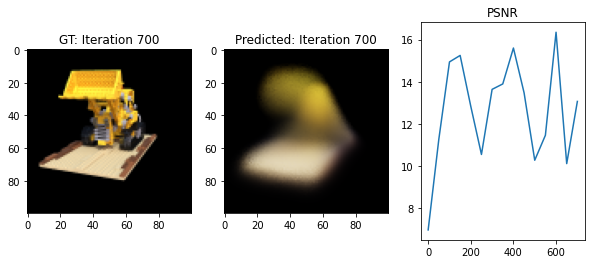

Loss: 0.06334035098552704


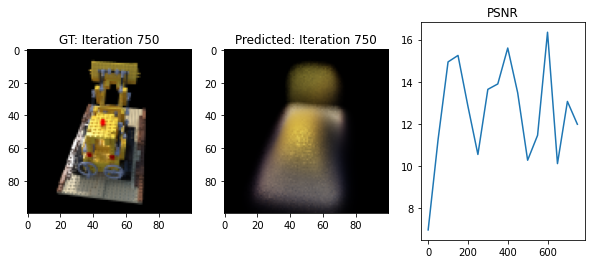

Loss: 0.013902057893574238


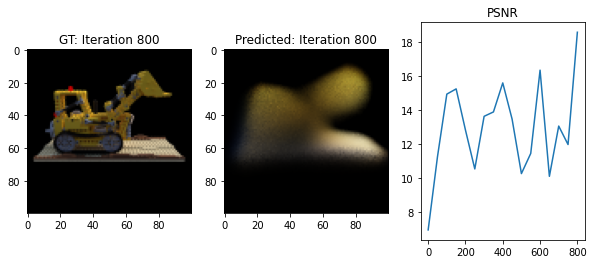

Loss: 0.030307209119200706


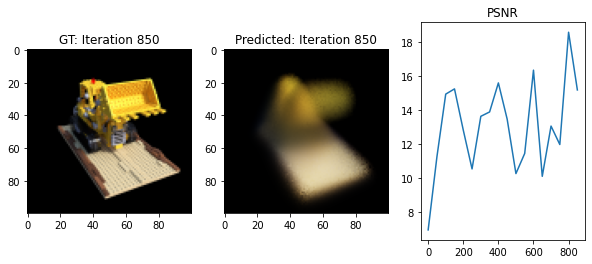

Loss: 0.07611915469169617


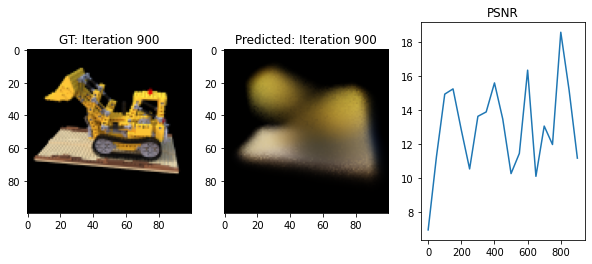

Loss: 0.054152458906173706


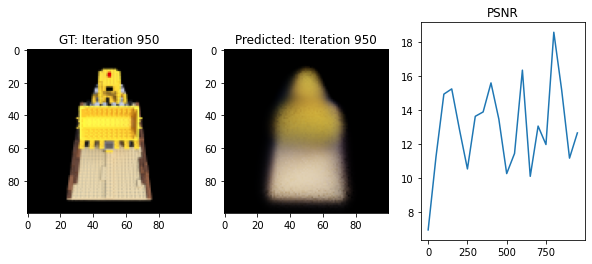

Loss: 0.04878181219100952


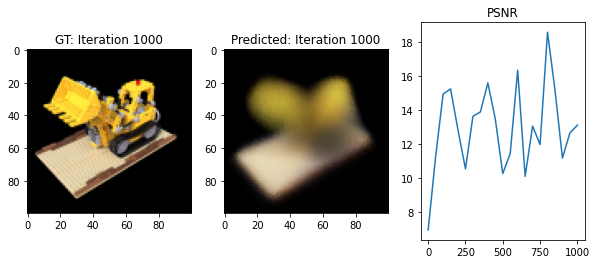

Loss: 0.1109742820262909


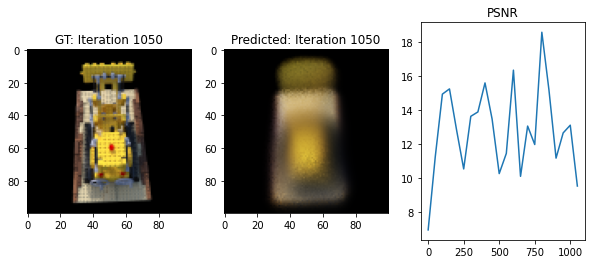

Loss: 0.03894324228167534


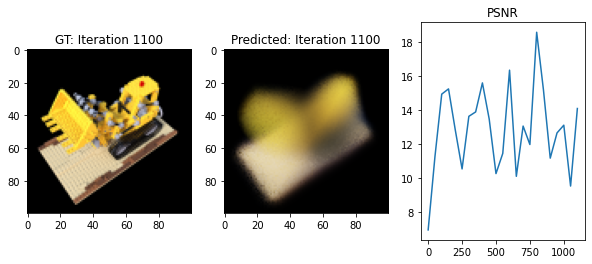

Loss: 0.11300340294837952


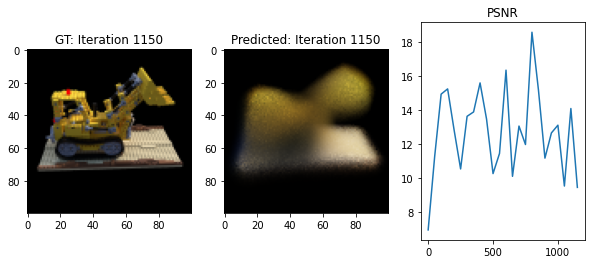

Loss: 0.05384432151913643


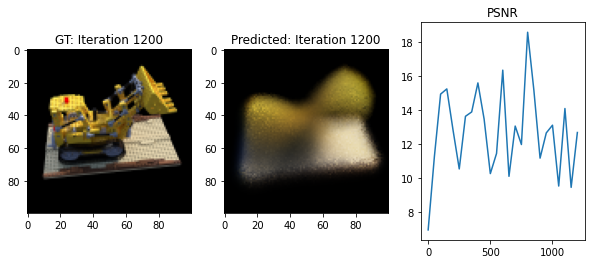

Loss: 0.027337968349456787


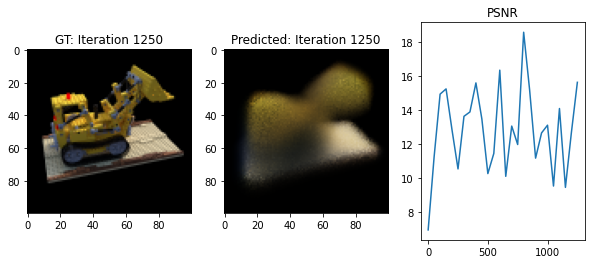

Loss: 0.044441550970077515


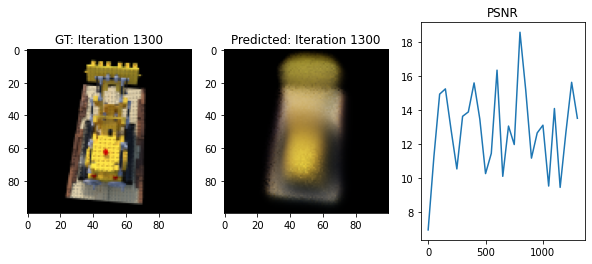

Loss: 0.07414434850215912


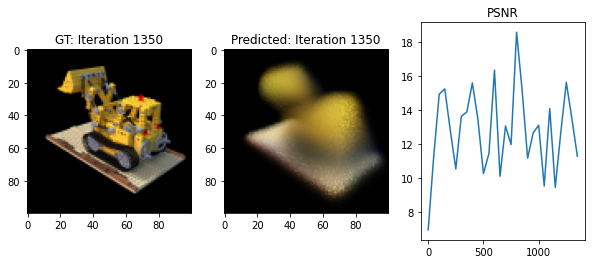

Loss: 0.05068609118461609


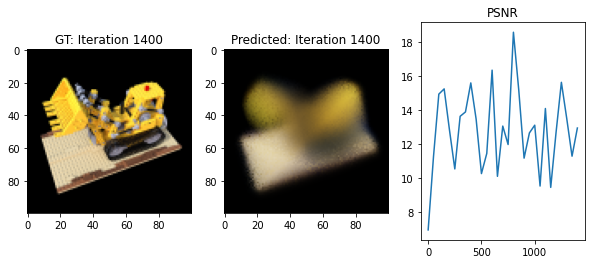

Loss: 0.05675744637846947


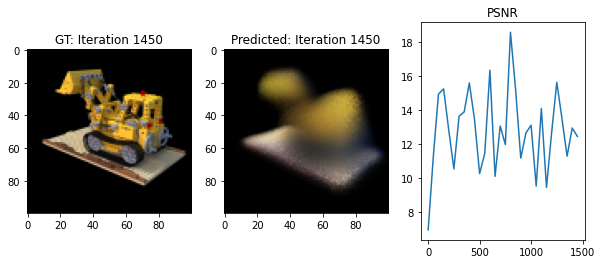

Loss: 0.10571520775556564


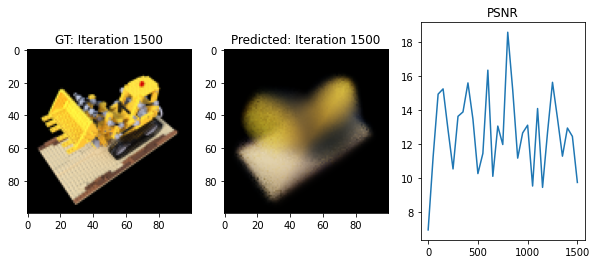

Loss: 0.03100692108273506


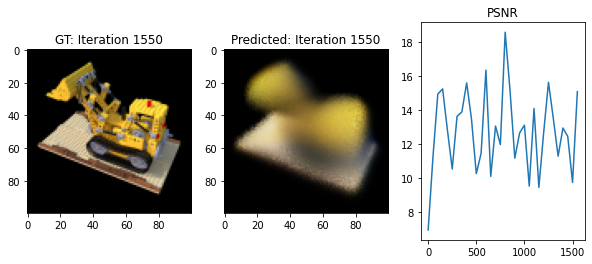

KeyboardInterrupt: ignored

In [ ]:
train(model, optimizer, encode, num_iters, name='tiny-nerf-no-pe')

### With PE
$L = 3$

In [ ]:
"""
Parameters for TinyNeRF training
"""
num_encoding_functions = 3
encode = lambda x: positional_encoding(x, num_encoding_functions=num_encoding_functions)
depth_samples_per_ray = 32
chunksize = 4096
lr = 5e-3
num_iters = 1000
display_every = 50  # Number of iters after which stats are displayed

config = TinyNeRFConfig()
config.num_encoding_functions = 3
model = VeryTinyNerfModel(num_encoding_functions=num_encoding_functions)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
config

TinyNeRFConfig(num_encoding_functions=3, depth_samples_per_ray=32, chunksize=4096, lr=0.005, num_iters=1000, display_every=50, n_layers=3, filter_size=128)

loss,█▃▂▄▅▁▃▅▅▄▄▆▅▁▆▅▅▂▄▃
psnr,▁▄▅▃▂█▄▂▂▃▃▂▂▇▂▂▂▄▃▄
loss,0.04511
psnr,13.45739


  0%|          | 0/1000 [00:00<?, ?it/s]

Loss: 0.1597694456577301


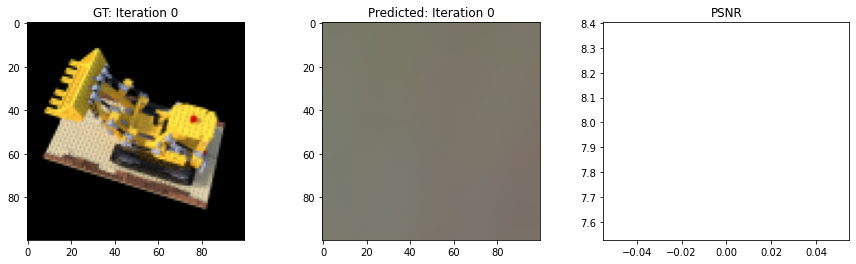

Loss: 0.055196743458509445


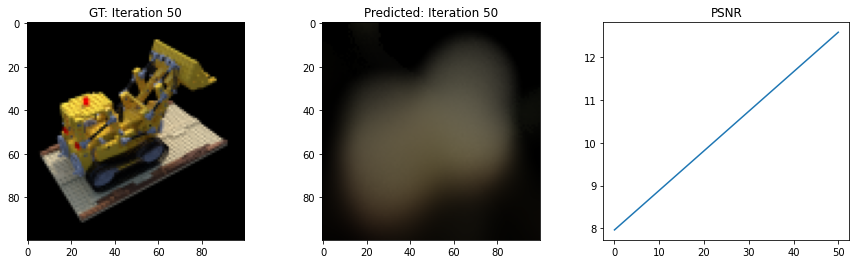

Loss: 0.03868936374783516


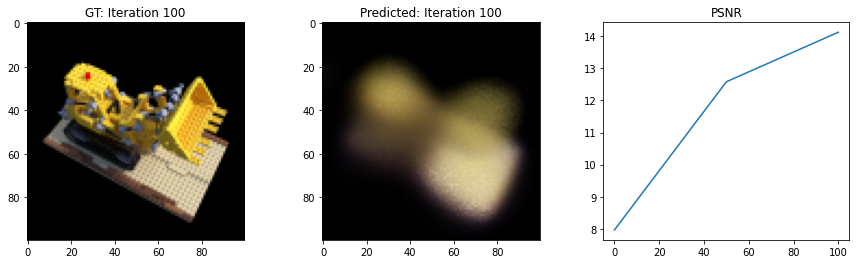

Loss: 0.09100329130887985


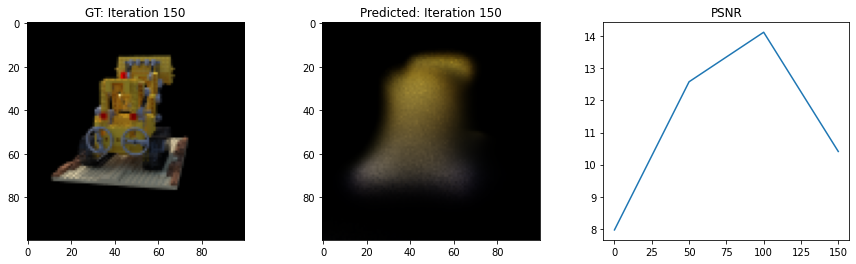

Loss: 0.13387088477611542


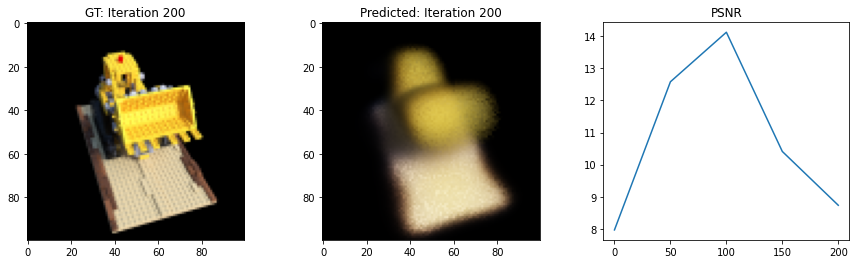

Loss: 0.08435384929180145


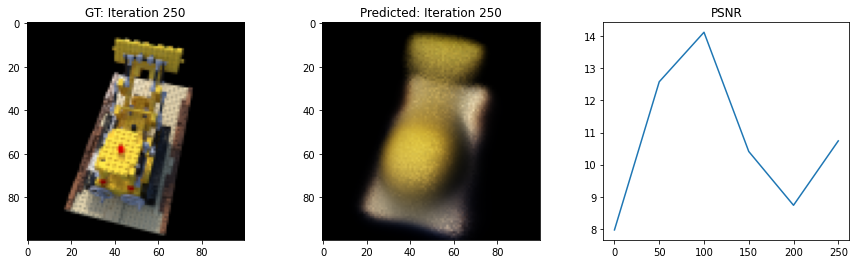

Loss: 0.08564291894435883


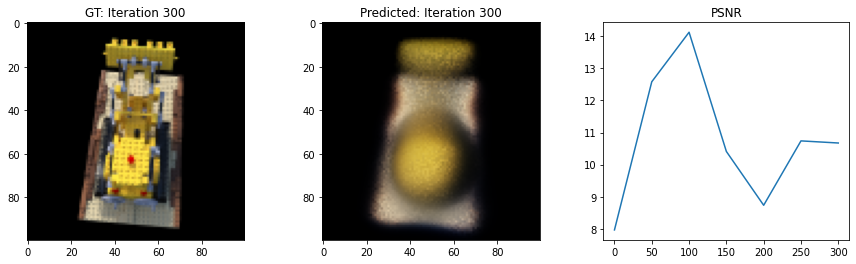

Loss: 0.07066982239484787


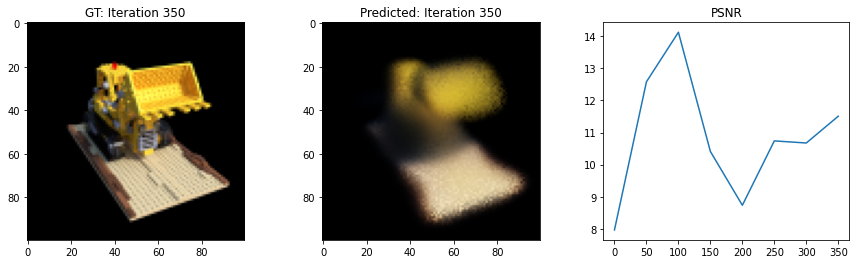

Loss: 0.04184577614068985


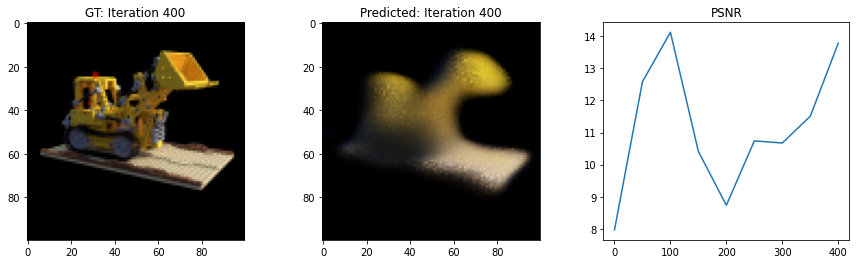

Loss: 0.1116962730884552


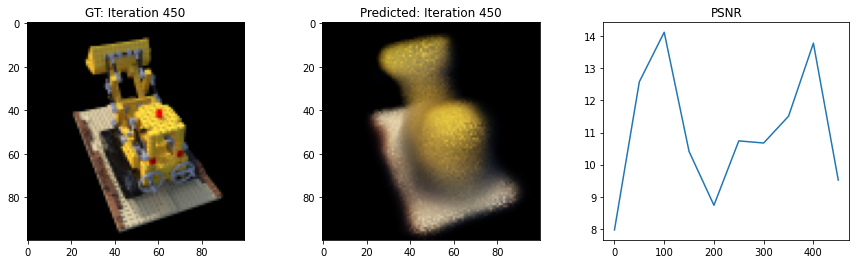

Loss: 0.1166515052318573


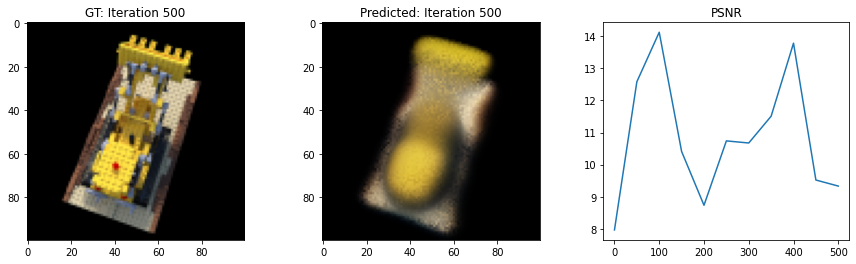

Loss: 0.02740018256008625


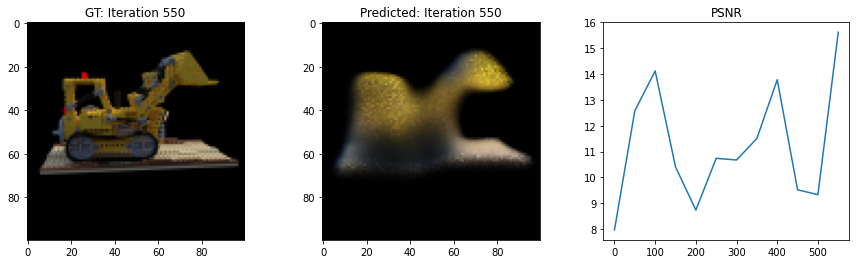

Loss: 0.07680381834506989


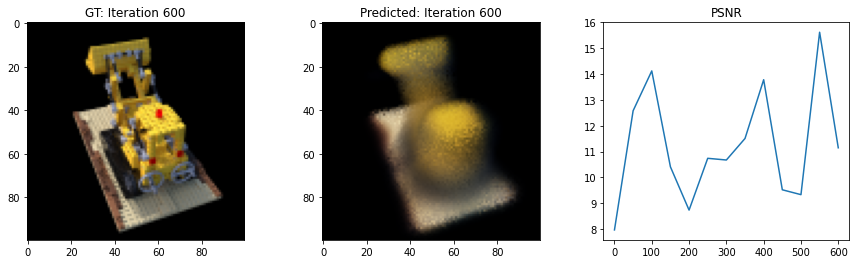

Loss: 0.080510213971138


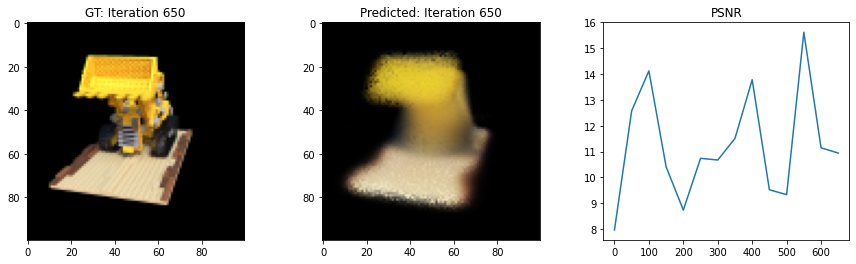

Loss: 0.03728797286748886


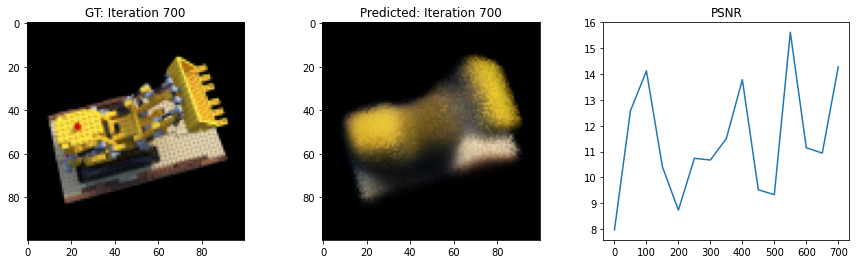

Loss: 0.0700283795595169


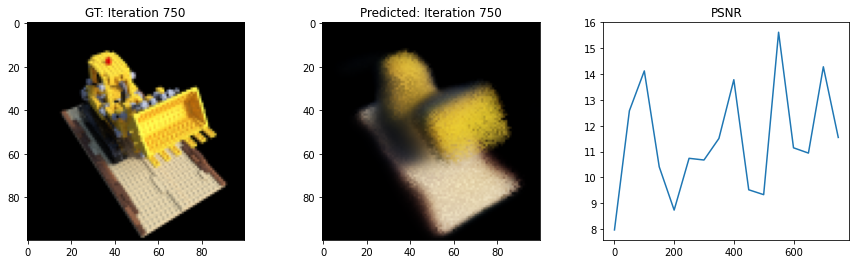

Loss: 0.044487252831459045


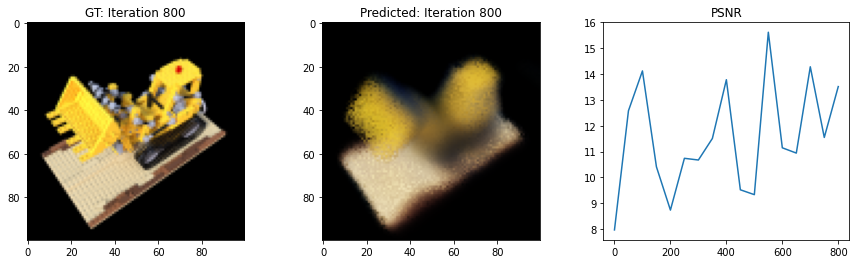

Loss: 0.1572563797235489


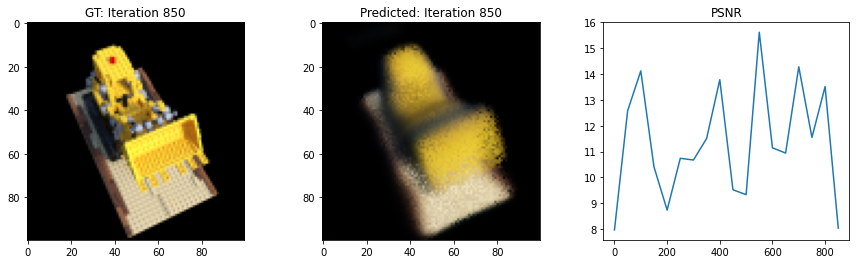

Loss: 0.05997072905302048


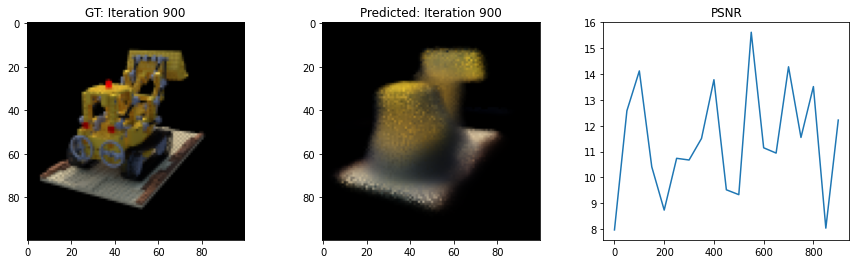

Loss: 0.04158620163798332


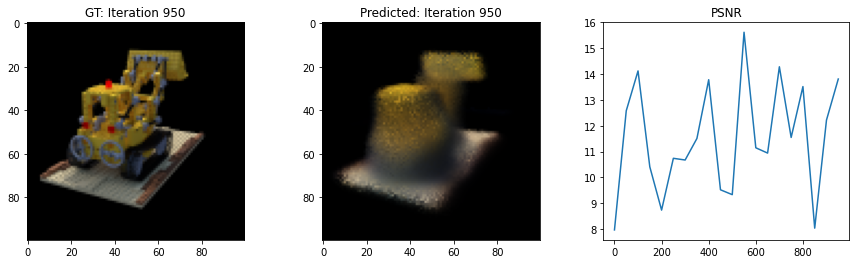

Done!


([7.965063095092773,
  12.580865859985352,
  14.12408447265625,
  10.409429550170898,
  8.733138084411621,
  10.738950729370117,
  10.67308521270752,
  11.507659912109375,
  13.783483505249023,
  9.519613265991211,
  9.331096649169922,
  15.622465133666992,
  11.146172523498535,
  10.941490173339844,
  14.284313201904297,
  11.547259330749512,
  13.517644882202148,
  8.033917427062988,
  12.220606803894043,
  13.810506820678711],
 [0,
  50,
  100,
  150,
  200,
  250,
  300,
  350,
  400,
  450,
  500,
  550,
  600,
  650,
  700,
  750,
  800,
  850,
  900,
  950])

In [ ]:
train(model, optimizer, encode, num_iters, name='tiny-nerf-3-pe', config=config)

### With PE
$L = 10$

In [ ]:
"""
Parameters for TinyNeRF training
"""
num_encoding_functions = 10
encode = lambda x: positional_encoding(x, num_encoding_functions=num_encoding_functions)
depth_samples_per_ray = 32
chunksize = 4096
lr = 5e-3
num_iters = 1000
display_every = 50  # Number of iters after which stats are displayed

config = TinyNeRFConfig()
config.num_encoding_functions = 10
model = VeryTinyNerfModel(num_encoding_functions=num_encoding_functions)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
config

TinyNeRFConfig(num_encoding_functions=10, depth_samples_per_ray=32, chunksize=4096, lr=0.005, num_iters=1000, display_every=50, n_layers=3, filter_size=128)

loss,█▂▂▄▇▄▄▃▂▅▆▁▄▄▂▃▂█▃▂
psnr,▁▅▇▃▂▄▃▄▆▂▂█▄▄▇▄▆▁▅▆
loss,0.04159
psnr,13.81051


  0%|          | 0/1000 [00:00<?, ?it/s]

Loss: 0.17747581005096436


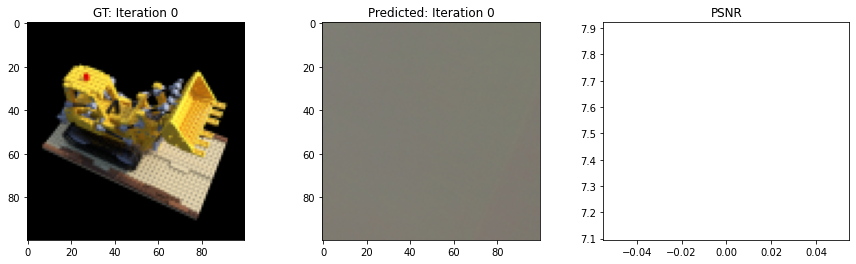

Loss: 0.049442753195762634


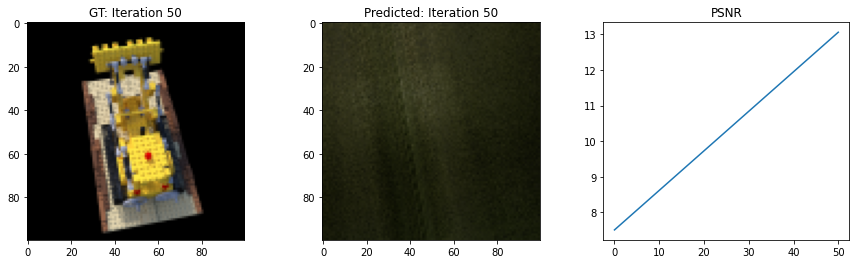

Loss: 0.07713048160076141


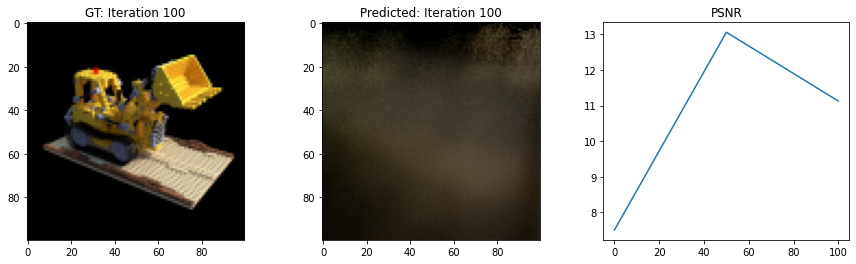

Loss: 0.0750913918018341


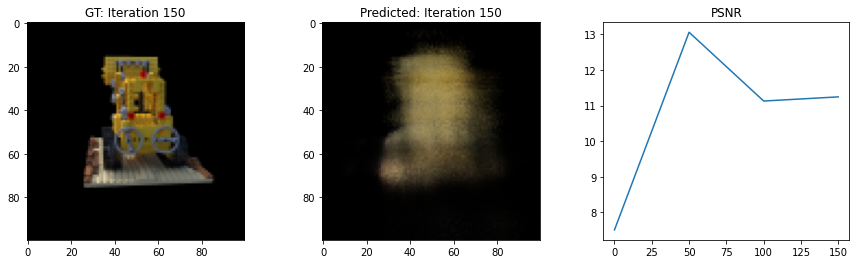

Loss: 0.11361108720302582


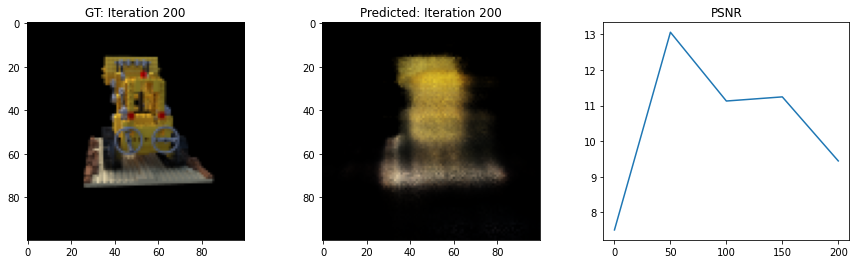

Loss: 0.11099518835544586


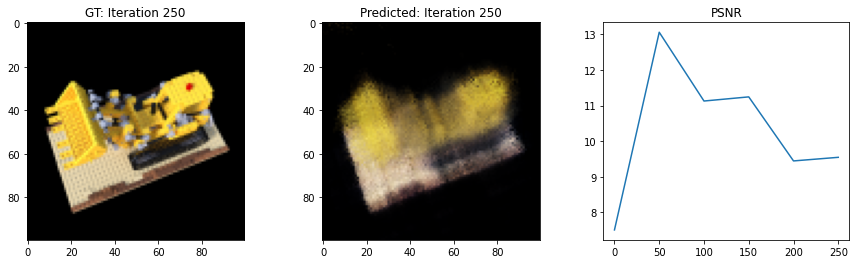

Loss: 0.024876965209841728


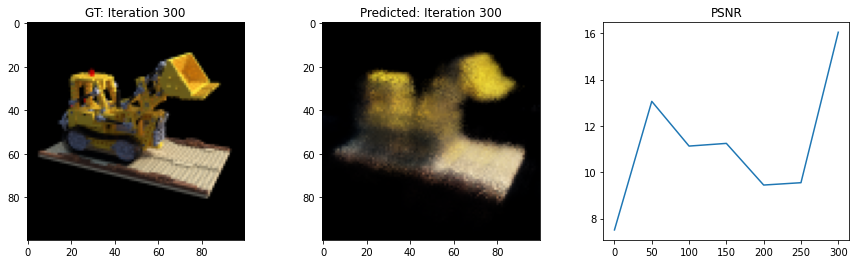

Loss: 0.0355374850332737


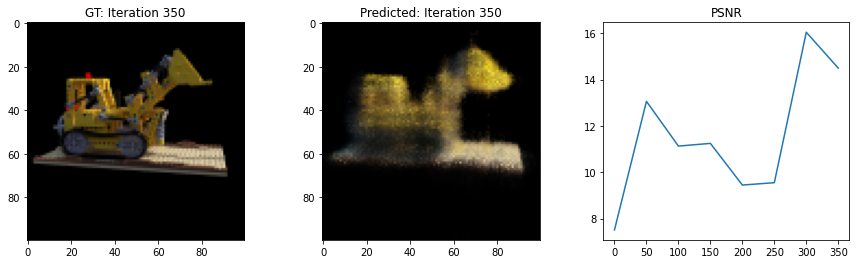

Loss: 0.10618782043457031


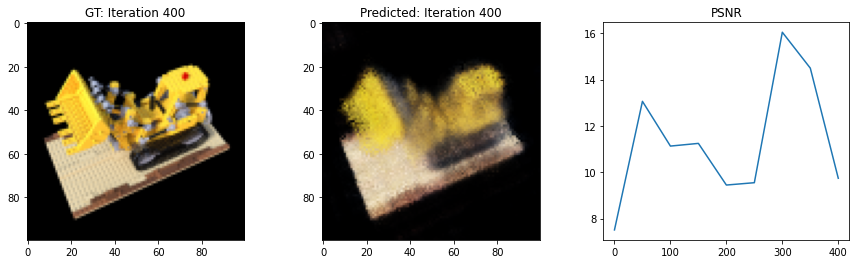

Loss: 0.12984152138233185


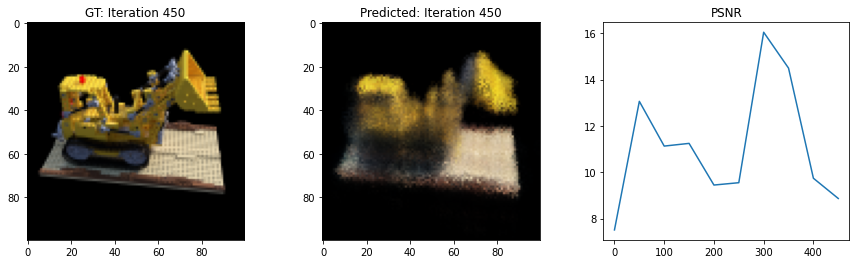

Loss: 0.04525357112288475


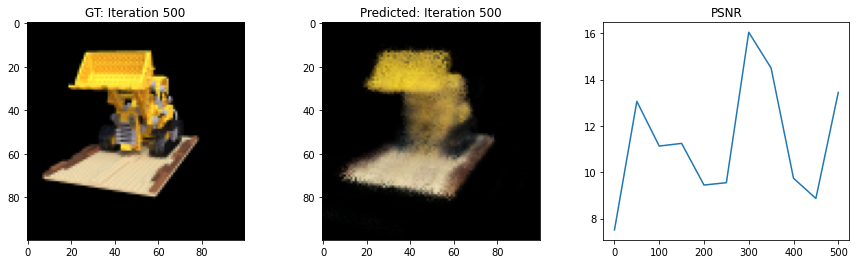

Loss: 0.05304979905486107


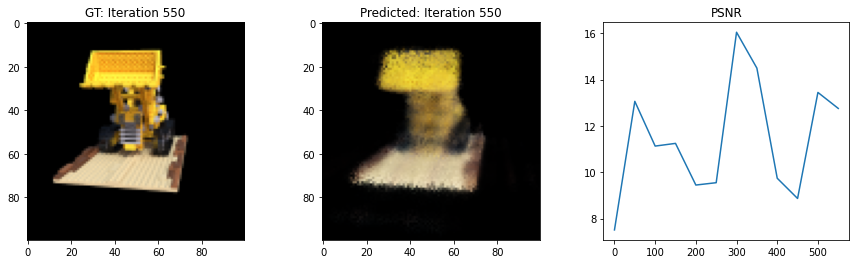

Loss: 0.09418336302042007


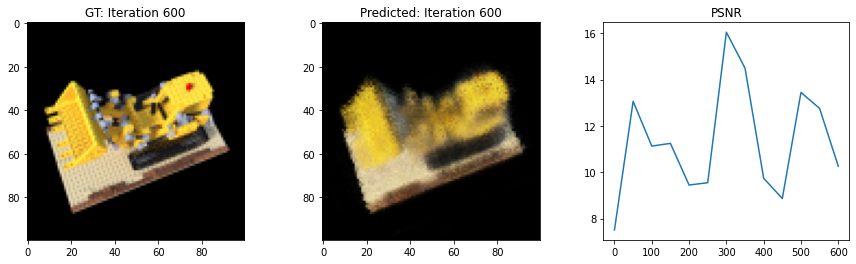

Loss: 0.04016592726111412


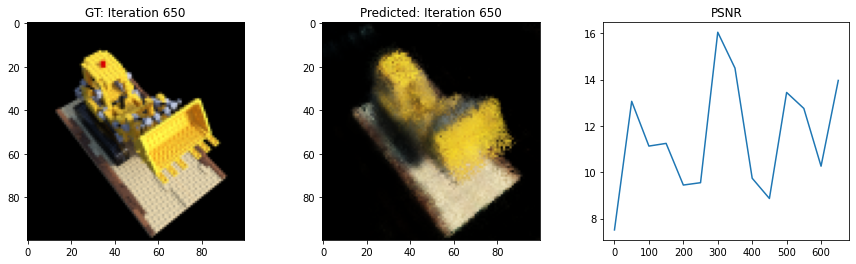

Loss: 0.09547380357980728


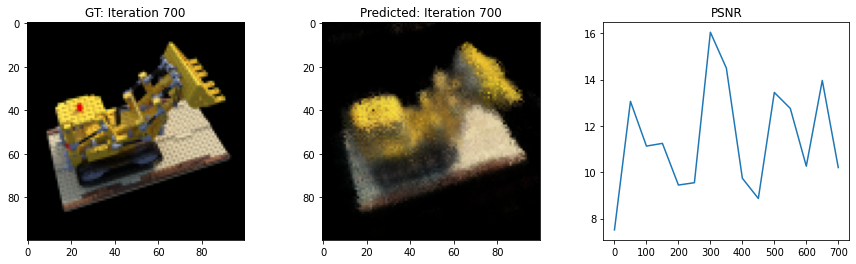

Loss: 0.07046514004468918


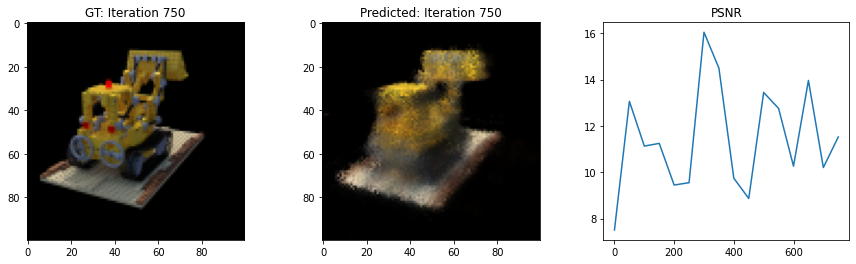

Loss: 0.04942101985216141


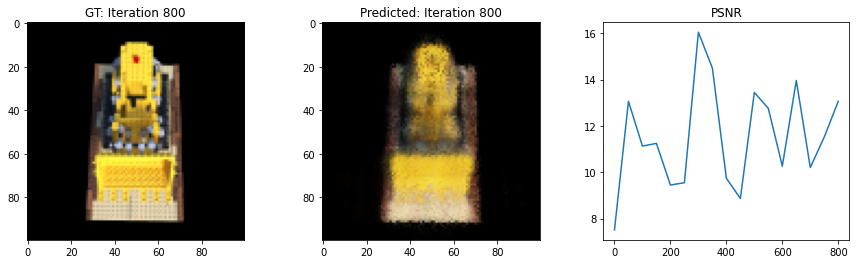

Loss: 0.08627470582723618


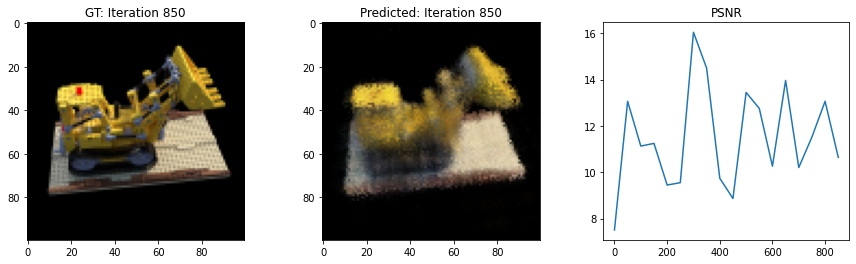

Loss: 0.05894593149423599


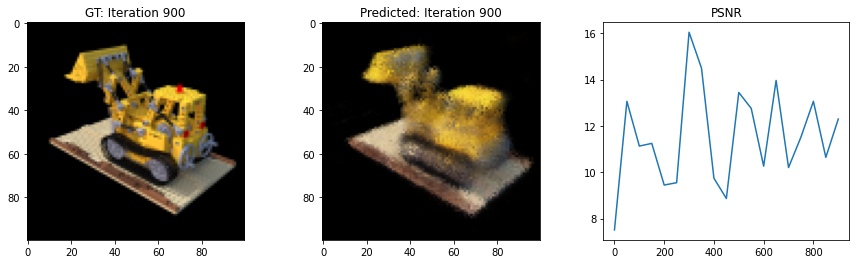

Loss: 0.11917903274297714


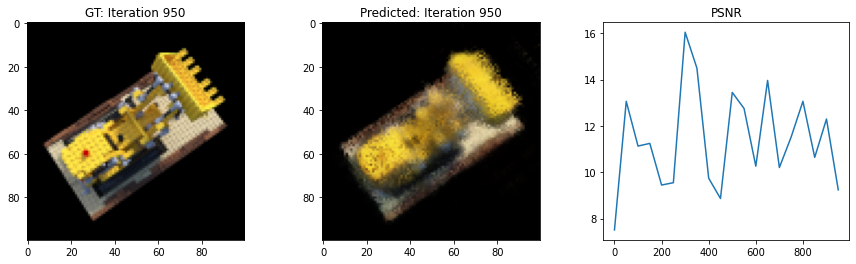

Done!


([7.508607864379883,
  13.05897331237793,
  11.127739906311035,
  11.244097709655762,
  9.445793151855469,
  9.546957969665527,
  16.04202651977539,
  14.493132591247559,
  9.739253044128418,
  8.865863800048828,
  13.44347095489502,
  12.753162384033203,
  10.260257720947266,
  13.961421966552734,
  10.201157569885254,
  11.520256996154785,
  13.060883522033691,
  10.641164779663086,
  12.295461654663086,
  9.238001823425293],
 [0,
  50,
  100,
  150,
  200,
  250,
  300,
  350,
  400,
  450,
  500,
  550,
  600,
  650,
  700,
  750,
  800,
  850,
  900,
  950])

In [ ]:
train(model, optimizer, encode, num_iters, name='tiny-nerf-10-pe', config=config)

### Fewer Images
50 images

In [ ]:
data = np.load("tiny_nerf_data.npz")
images = data["images"]
tform_cam2world = data["poses"]
tform_cam2world = torch.from_numpy(tform_cam2world).to(device)
focal_length = data["focal"]
focal_length = torch.from_numpy(focal_length).to(device)
height, width = images.shape[1:3]
near_thresh = 2.
far_thresh = 6.
n_images = 50
images = torch.from_numpy(images[:n_images, ..., :3]).to(device)

In [ ]:
"""
Parameters for TinyNeRF training
"""
num_encoding_functions = 6
encode = lambda x: positional_encoding(x, num_encoding_functions=num_encoding_functions)
depth_samples_per_ray = 32
chunksize = 4096
lr = 5e-3
num_iters = 2000
display_every = 50  # Number of iters after which stats are displayed

config = TinyNeRFConfig()
model = VeryTinyNerfModel(num_encoding_functions=num_encoding_functions)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
config

TinyNeRFConfig(num_encoding_functions=6, depth_samples_per_ray=32, chunksize=4096, lr=0.005, num_iters=1000, display_every=50, n_layers=3, filter_size=128)

loss,█▂▃▃▅▅▁▁▅▆▂▂▄▂▄▃▂▄▃▅
psnr,▁▆▄▄▃▃█▇▃▂▆▅▃▆▃▄▆▄▅▂
loss,0.11918
psnr,9.238


  0%|          | 0/2000 [00:00<?, ?it/s]

Loss: 0.17291726171970367


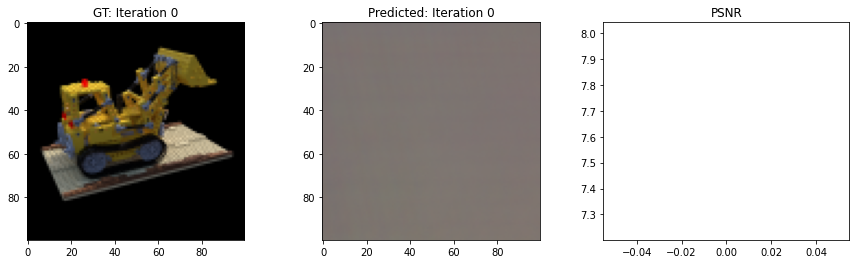

Loss: 0.07654374837875366


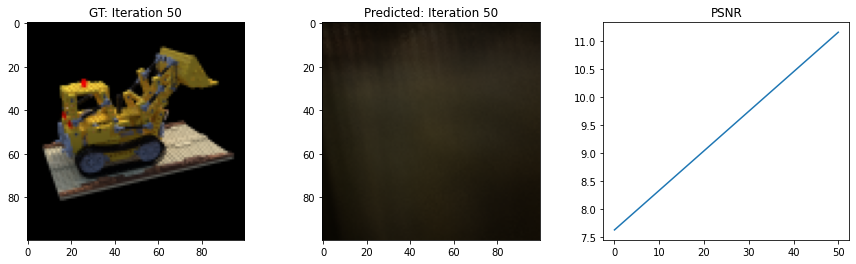

Loss: 0.08011690527200699


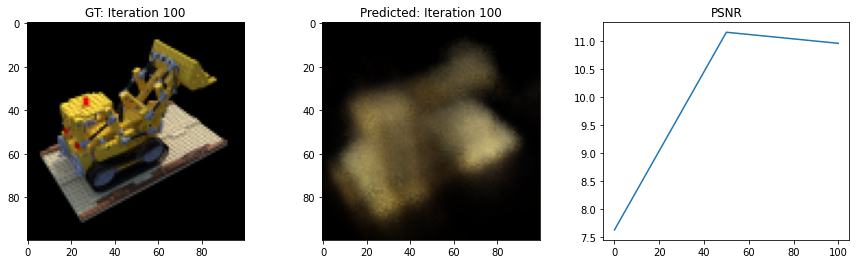

Loss: 0.07729276269674301


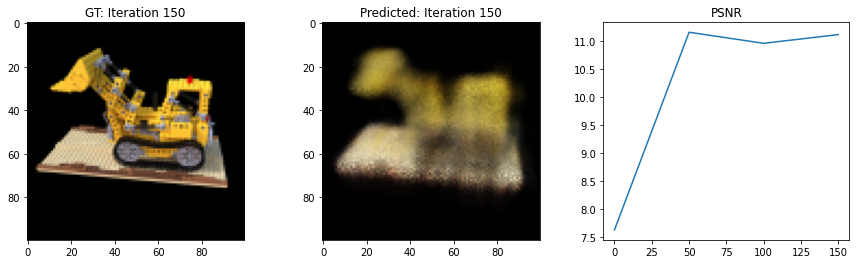

Loss: 0.0649118721485138


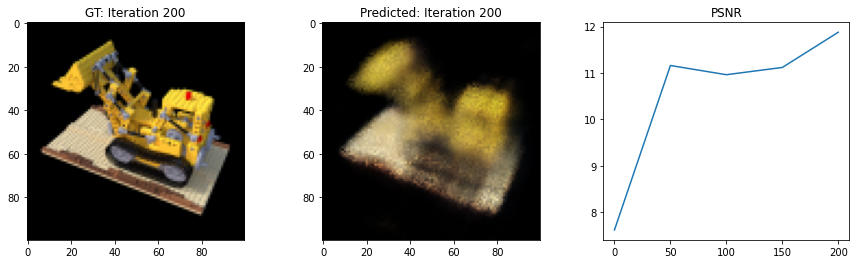

Loss: 0.06521095335483551


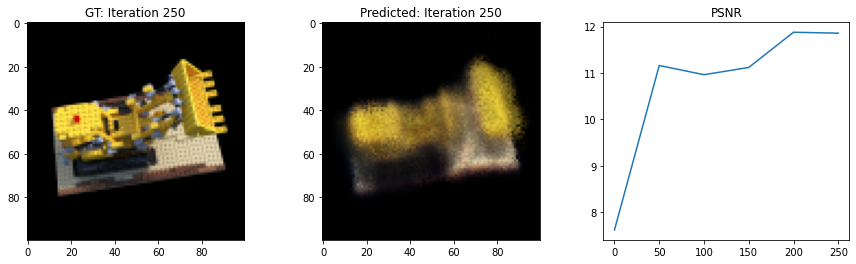

Loss: 0.1022108867764473


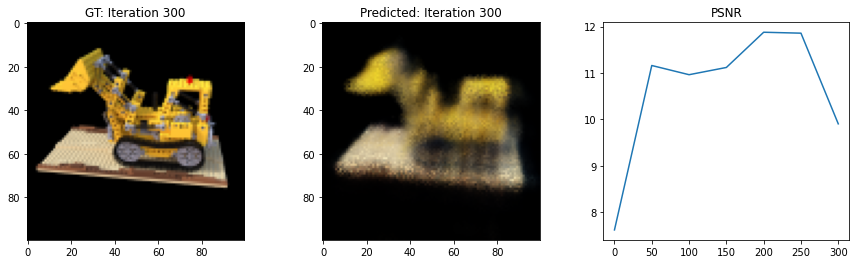

Loss: 0.034103874117136


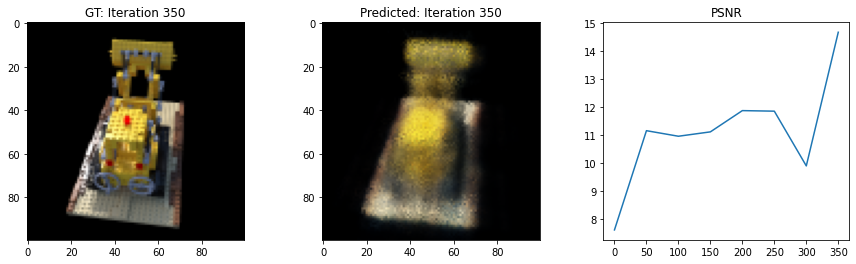

Loss: 0.008852350525557995


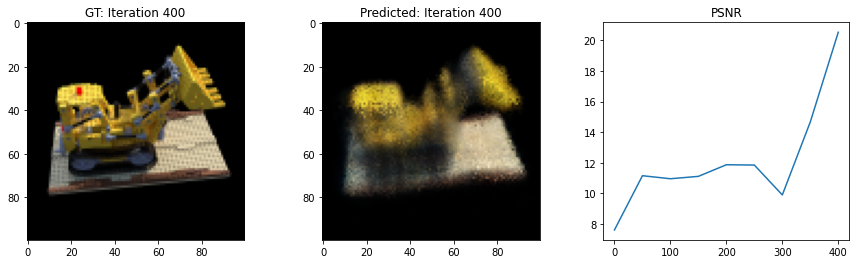

Loss: 0.04913582652807236


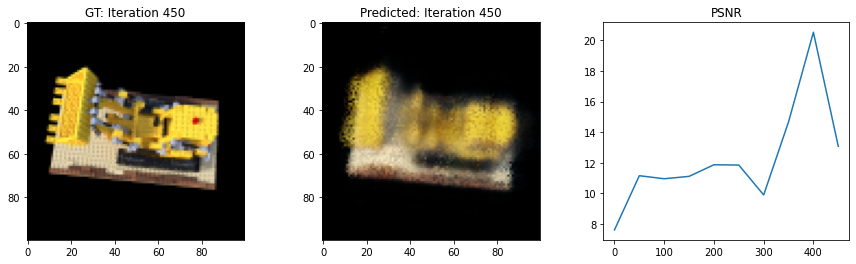

Loss: 0.11936210095882416


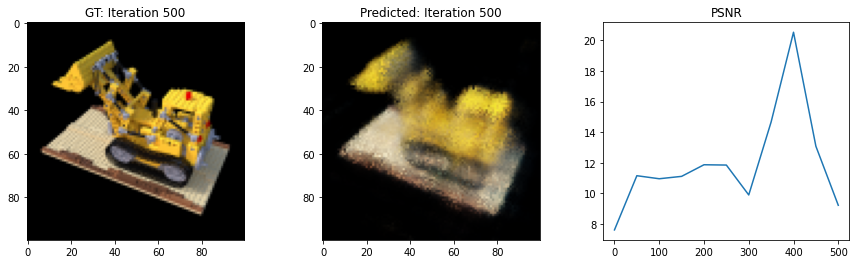

Loss: 0.10745447129011154


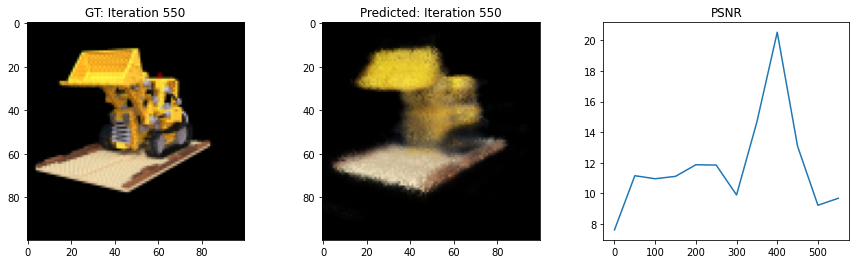

Loss: 0.012761947698891163


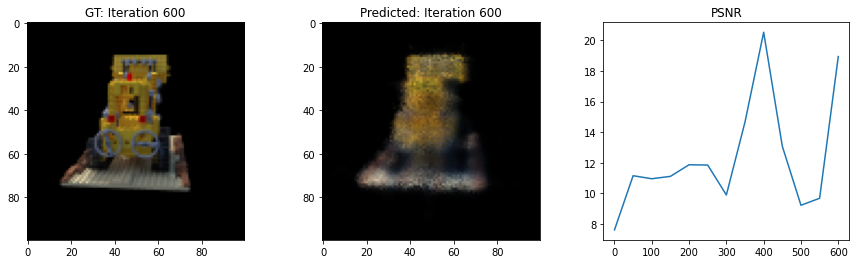

Loss: 0.08074376732110977


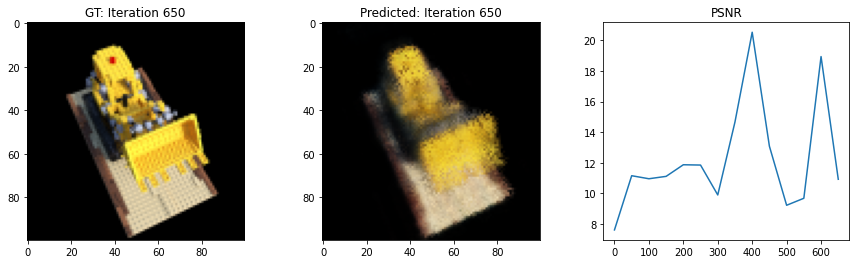

Loss: 0.027968332171440125


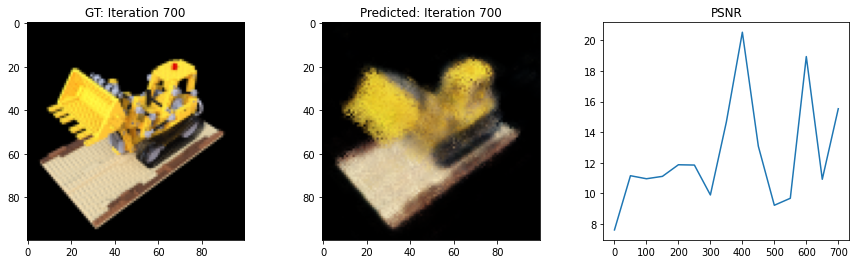

Loss: 0.04355708882212639


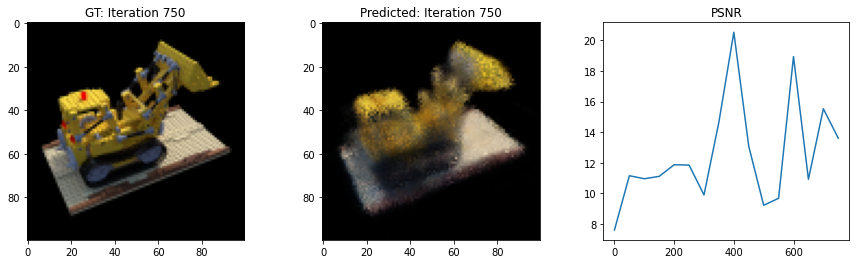

Loss: 0.06708085536956787


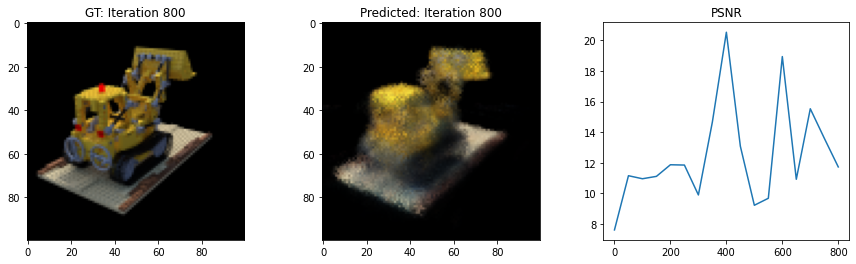

Loss: 0.0985775738954544


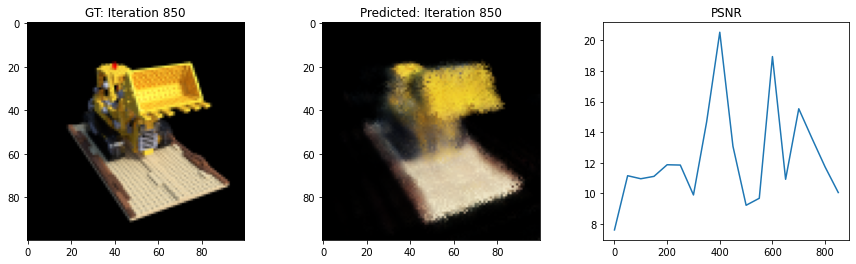

Loss: 0.07752490788698196


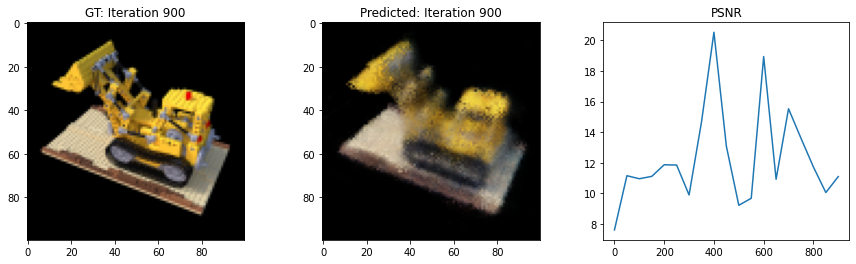

Loss: 0.0866059884428978


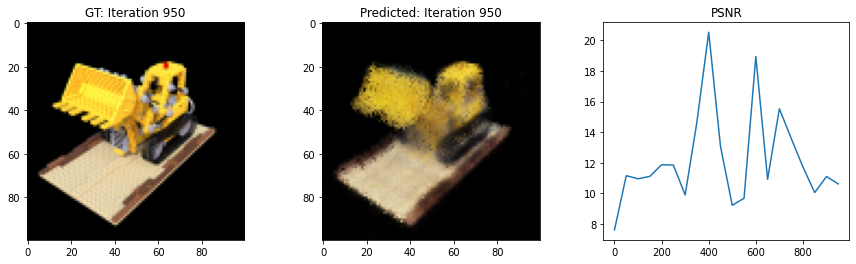

Loss: 0.08113862574100494


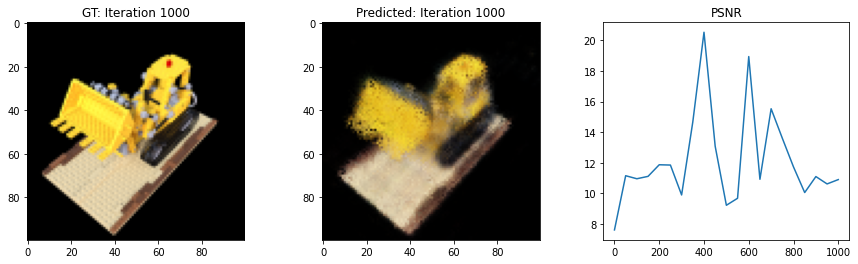

Loss: 0.00871863029897213


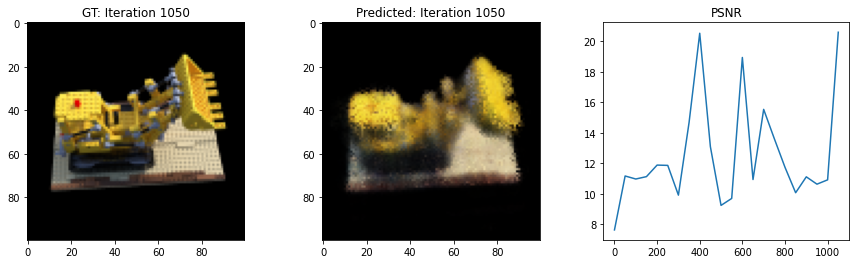

Loss: 0.08269187062978745


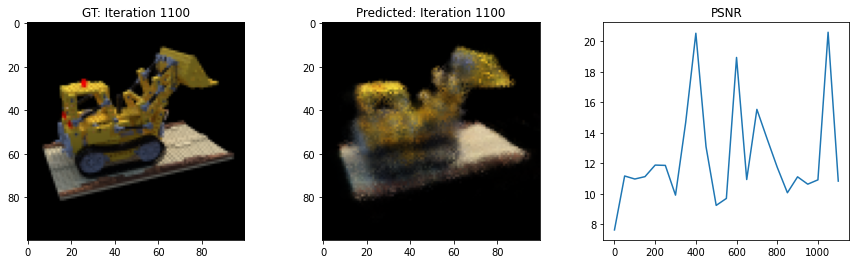

Loss: 0.1042349711060524


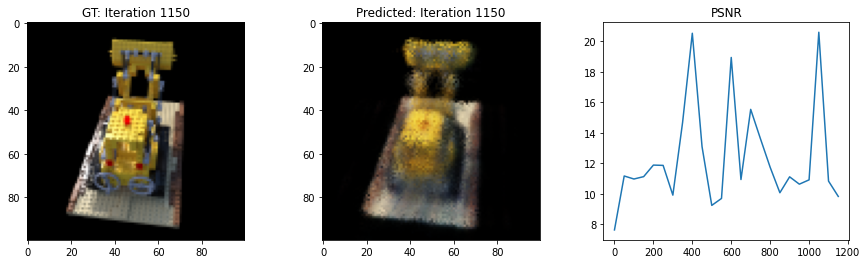

Loss: 0.060853343456983566


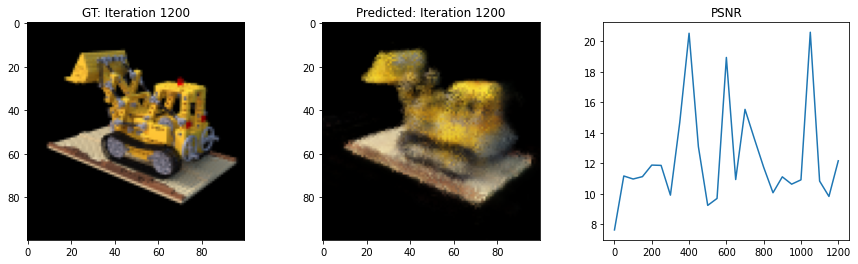

Loss: 0.09665972739458084


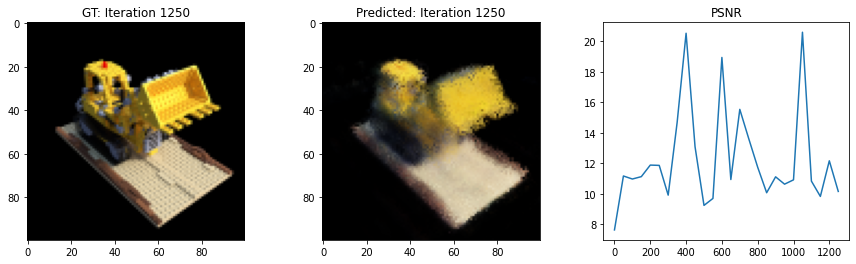

Loss: 0.04982497915625572


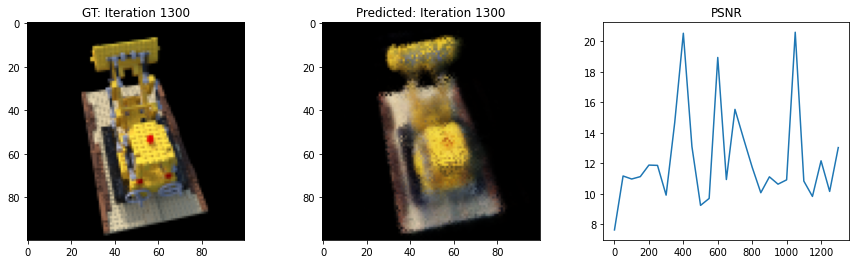

Loss: 0.06451025605201721


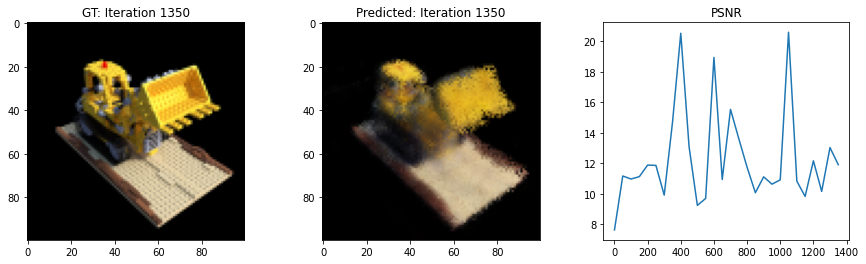

Loss: 0.09088201820850372


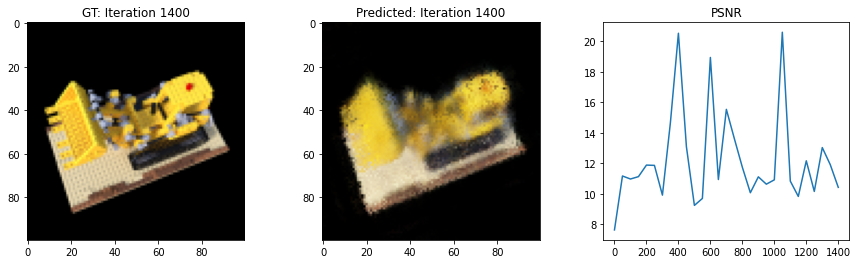

Loss: 0.11331663280725479


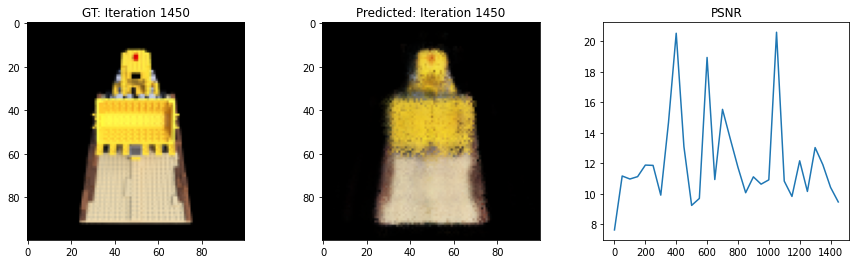

Loss: 0.10246000438928604


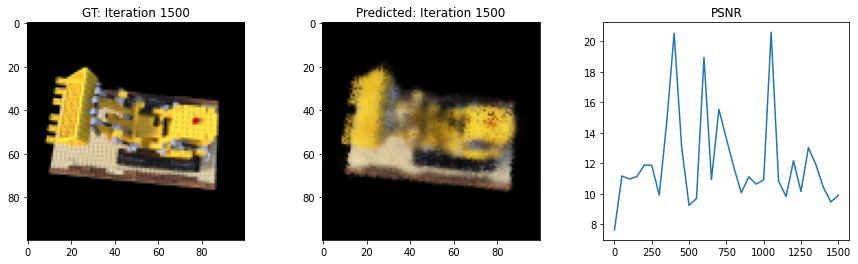

Loss: 0.060140691697597504


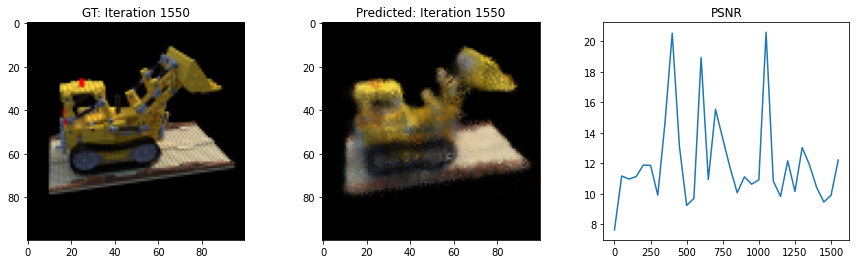

Loss: 0.09313209354877472


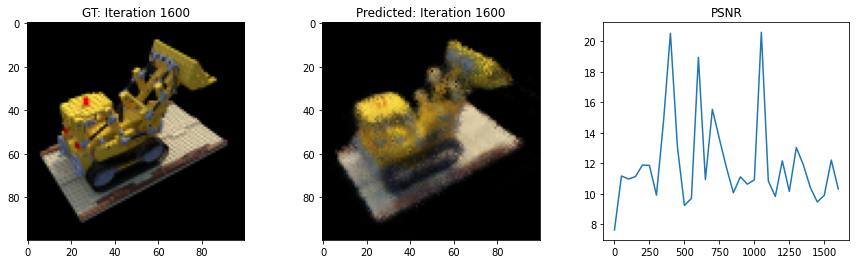

Loss: 0.06214287132024765


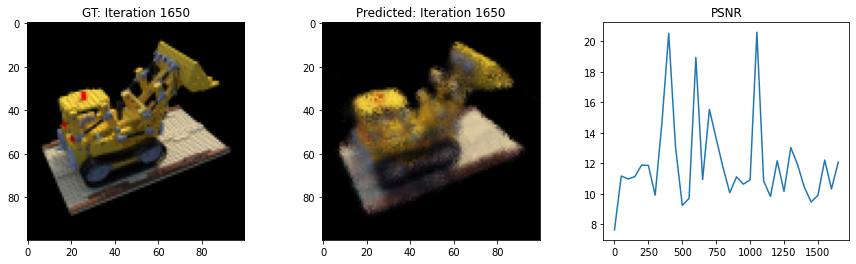

Loss: 0.07803061604499817


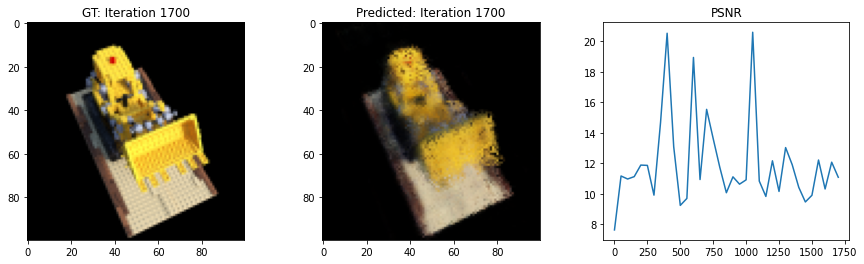

Loss: 0.10077989846467972


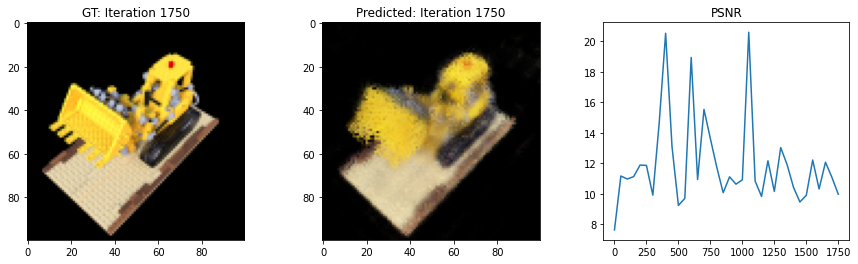

Loss: 0.04452090710401535


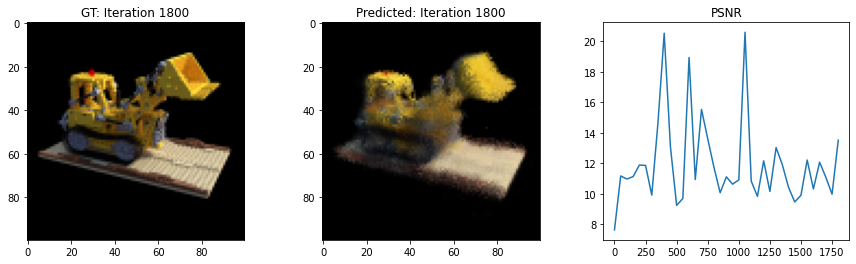

Loss: 0.08752299845218658


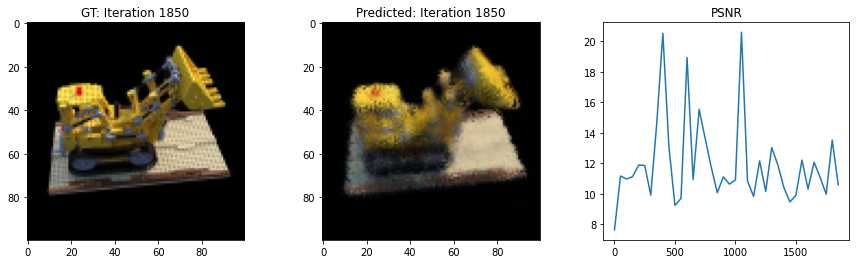

Loss: 0.04742295295000076


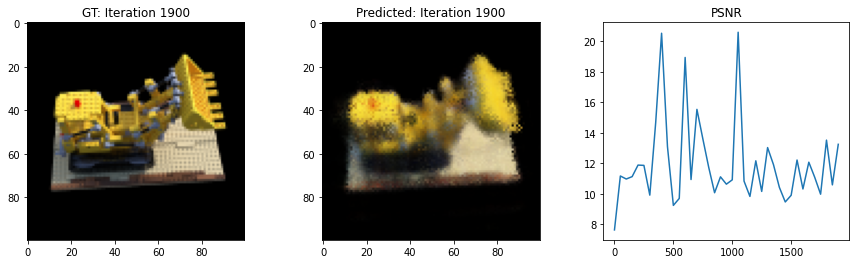

Loss: 0.10219857096672058


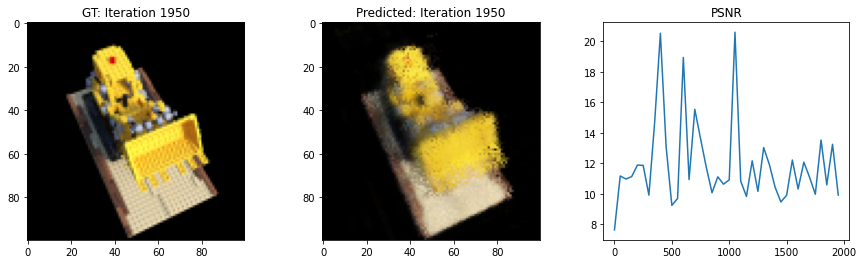

Done!


([7.621616840362549,
  11.160902976989746,
  10.96275806427002,
  11.118611335754395,
  11.876758575439453,
  11.856794357299805,
  9.905028343200684,
  14.67196273803711,
  20.5294132232666,
  13.086017608642578,
  9.231335639953613,
  9.687755584716797,
  18.94083023071289,
  10.928909301757812,
  15.533333778381348,
  13.609411239624023,
  11.734013557434082,
  10.06221866607666,
  11.105587005615234,
  10.624521255493164,
  10.907724380493164,
  20.595516204833984,
  10.825371742248535,
  9.819865226745605,
  12.15715503692627,
  10.147543907165527,
  13.025527954101562,
  11.90371322631836,
  10.415220260620117,
  9.457063674926758,
  9.894455909729004,
  12.208316802978516,
  10.309005737304688,
  12.066086769104004,
  11.077348709106445,
  9.96626091003418,
  13.514360427856445,
  10.578777313232422,
  13.240114212036133,
  9.90555191040039],
 [0,
  50,
  100,
  150,
  200,
  250,
  300,
  350,
  400,
  450,
  500,
  550,
  600,
  650,
  700,
  750,
  800,
  850,
  900,
  950,
 

In [ ]:
train(model, optimizer, encode, num_iters, name='tiny-nerf-50img-3+pe', config=config)

In [ ]:
train()

### Fewer Images
25 images

In [ ]:
data = np.load("tiny_nerf_data.npz")
images = data["images"]
tform_cam2world = data["poses"]
tform_cam2world = torch.from_numpy(tform_cam2world).to(device)
focal_length = data["focal"]
focal_length = torch.from_numpy(focal_length).to(device)
height, width = images.shape[1:3]
near_thresh = 2.
far_thresh = 6.
n_images = 25
images = torch.from_numpy(images[:n_images, ..., :3]).to(device)

In [ ]:
"""
Parameters for TinyNeRF training
"""
num_encoding_functions = 6
encode = lambda x: positional_encoding(x, num_encoding_functions=num_encoding_functions)
depth_samples_per_ray = 32
chunksize = 4096
lr = 5e-3
num_iters = 2000
display_every = 50  # Number of iters after which stats are displayed

config = TinyNeRFConfig()
model = VeryTinyNerfModel(num_encoding_functions=num_encoding_functions)
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
config

TinyNeRFConfig(num_encoding_functions=6, depth_samples_per_ray=32, chunksize=4096, lr=0.005, num_iters=1000, display_every=50, n_layers=3, filter_size=128)

wandb: Currently logged in as: quynhu_d (use `wandb login --relogin` to force relogin)


  0%|          | 0/2000 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Loss: 0.15734340250492096


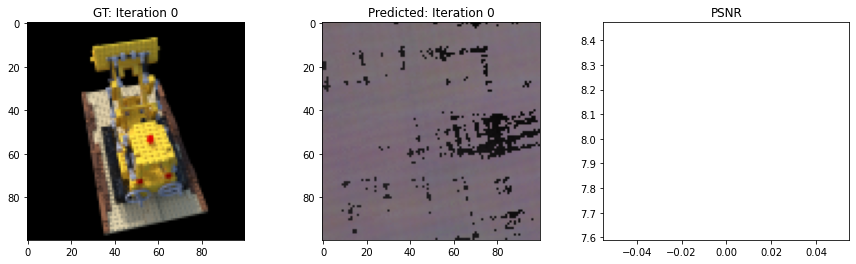

In [ ]:
train(model, optimizer, encode, num_iters, name='tiny-nerf-25img-3+pe', config=config)